<p align="center">
  <img src="../Data/Processed/Images/UniLogo.png" alt="University of Gloucestershire crest" width="200"/>
</p>

<h1 align="center">Earthquake Data Analysis Using Python Scripting (Global Earthquakes 2023)</h1>

<p align="center"><strong>Module:</strong> CT7201 &ndash; Python Notebooks and Scripting<br>
<strong>Tutor:</strong> Dr Zainab Loukil</p>

<p align="center"><strong>Team (Student names &amp; IDs):</strong><br>
Daniel Penson (S4520042)<br>
Hasini Adihetty (S4530499)<br>
Dinis Nascimento (S4540434)</p>

<p align="center"><strong>Date of submission:</strong> 15 January 2026</p>


---

## Table of Contents

- **Abstract**
- **1. Introduction**
- **2. Data Overview**
  - 2.1 Project Objectives
  - 2.2 Methodology
  - 2.3 Code Structure & Functions
- **3. Cleaning Pipeline**
- **4. Feature Engineering**
  - 4.1 Design of the `engineer_features()` Function
  - 4.2 Engineered Feature Schema Summary
  - 4.3 Feature Engineering Pipeline
  - 4.4 Overview of Engineered Feature Groups
  - 4.5 Additional Feature-Level Visualisations
  - 4.6 Summary and Reflection
- **5. Exploratory Data Analysis (EDA)**
  - 5.1 Global Patterns
  - 5.2 Multivariate & Regional
- **6. Strong Quake Classification**
  - 6.1 Data split, pipeline, and models
  - 6.2 Evaluation visuals (confusion, ROC, PR)
  - 6.3 Drivers of strong quake predictions
  - 6.4 Interpretation
  - 6.5 Result integration
- **7. Discussion and Interpretation**
- **8. Conclusion**
- **9. References**


<a id="table-of-figures"></a>

## Table of Figures
- Figure 1. Magnitude distribution (raw).
- Figure 2. Depth distribution (raw).
- Figure 3. Global epicentre scatter (raw).
- Figure 4. Event-type distribution (raw).
- Figure 5. Engineered feature groups overview.
- Figure 6. Magnitude severity profile.
- Figure 7. Magnitude distribution by depth category.
- Figure 8. Epicentres with tectonic boundaries.
- Figure 9. Magnitude density by depth category (KDE).
- Figure 10. Depth distribution sanity check.
- Figure 11. Station-coverage diagnostics.
- Figure 12. Nearest-station distance distribution.
- Figure 13. Temporal reporting patterns.
- Figure 14. Correlation heatmap.
- Figure 15. Magnitude vs depth (scatter + depth-class distribution).
- Figure 16. Plotly epicentre map (interactive) with static fallback.
- Figure 17. Regional seismicity comparisons.
- Figure 18. Quality score and uncertainty diagnostics.
- Figure 19. Model evaluation (confusion matrix + ROC + PR).
- Figure 20. Temporal robustness test (time-ordered split).

<a id="table-of-tables"></a>

## Table of Tables
- Table 1. Raw dataset preview (2023 USGS catalogue; N = 26,642).
- Table 2. Numeric summary of raw magnitudes and depths.
- Table 3. Cleaning audit summary.
- Table 4. Class balance after cleaning.
- Table 5. Engineered dataset preview.
- Table 6. Summary from the depth vs magnitude analysis.
- Table 7. Regional seismicity comparison summary.


---

## Abstract

This project analyses the 2023 USGS Global Earthquake Catalog (N = 26,642 events) using a reproducible Python workflow focused on data integrity, interpretable visual evidence, and baseline classification. The pipeline performs transparent cleaning (deduplication, validity bounds for latitude/longitude, depth, and magnitude, and filtering to confirmed earthquake event types), resulting in a cleaned dataset of 24,432 earthquakes. Strong earthquakes are defined as Mw ≥ 6.0, yielding 146 positive cases (~0.6%), which creates an extreme class imbalance.

Feature engineering adds temporal descriptors, coarse spatial context, depth categories, and measurement-quality indicators for analysis and diagnostics. Exploratory analysis confirms strong clustering along tectonic boundaries and shows that uneven sensor coverage can influence apparent regional activity. A supervised learning baseline is then constructed to classify strong events using non-leaking predictors (excluding magnitude-derived and target-defining fields). Logistic Regression, Random Forest, and XGBoost are evaluated with metrics appropriate for rare events (precision-recall behaviour and average precision). Results show that recall can be improved, but precision remains low due to rarity and overlap between classes; therefore outputs are presented as a baseline and interpreted cautiously rather than as forecasting.

---

## 1. Introduction

Earthquakes cannot be reliably predicted in the “forecasting” sense using catalogue metadata alone. This project instead addresses a more modest and measurable task: **given an event record at the time it is logged, can we classify whether it is a strong earthquake (Mw ≥ 6.0)?** The analysis uses 2023 as a one-year snapshot of global seismicity to describe depth/magnitude structure, identify data-quality signals, and test whether engineered features provide useful separation between strong and non-strong events.

This work is descriptive and diagnostic: it aims to explain patterns in the recorded catalogue and evaluate baseline classification performance under real constraints (rare strong events, uneven monitoring, and measurement uncertainty).


---

## 2. Data Overview

The raw 2023 USGS catalogue includes both **physical fields** (latitude, longitude, depth, magnitude) and **sensor-/solution-derived fields** (e.g., azimuthal gap and RMS). Because events are aggregated across multiple seismic networks, monitoring is geographically uneven. Regions with dense instrumentation may record more small events due to better detection rather than true differences in physical seismicity. This limitation is explicitly considered when interpreting maps and regional comparisons.


## 2.1 Project Objectives

1. Summarise the raw 2023 earthquake catalogue and establish baseline distributions and data-quality signals.
2. Apply a transparent cleaning workflow using physically plausible validity windows and auditable step-logging.
3. Engineer interpretable features to support EDA and baseline classification, while avoiding target leakage in modelling.
4. Evaluate baseline models for strong-event detection using metrics appropriate for rare events.


## 2.2 Methodology

- Load the raw CSV catalogue and inspect schema, missingness, and baseline distributions.
- Apply cleaning rules to remove duplicates, enforce physical plausibility, and retain only earthquake events.
- Engineer temporal, spatial, depth-class, and quality-diagnostic features.
- Conduct EDA (maps, distributions, correlations, regional comparisons).
- Build baseline classifiers (Logistic Regression, Random Forest, XGBoost) and evaluate using precision-recall behaviour and average precision.


## 2.3 Code Structure & Functions

The notebook uses an object-oriented structure to improve reproducibility and reduce duplication. Utility functions and shared settings are defined in `earthquakelibs.py`. Visualisations are organised through helper classes (e.g., `EQVisualizer`) so plotting logic is separated from analysis steps. A lightweight pipeline object centralises data loading and output paths to reduce notebook state coupling and support repeatable execution.

## 2.3.1 Shared imports and project paths

This setup block loads the helper module, configures consistent plotting defaults, and defines standard input/output locations so the notebook runs reliably from different working directories.


In [2]:
import sys
import importlib.util
from pathlib import Path

# Ensure we import earthquakelibs.py from this project.
start = Path.cwd().resolve()
eq_path = None
parents = [start] + list(start.parents)[:6]

for parent in parents:
    cand = parent / "Notebooks" / "earthquakelibs.py"
    if cand.exists():
        eq_path = cand
        break
    cand = parent / "earthquakelibs.py"
    if cand.exists():
        eq_path = cand
        break

if eq_path is None:
    raise FileNotFoundError("earthquakelibs.py not found from " + str(start))

if str(eq_path.parent) not in sys.path:
    sys.path.insert(0, str(eq_path.parent))

spec = importlib.util.spec_from_file_location("earthquakelibs", str(eq_path))
if spec is None or spec.loader is None:
    raise ImportError(f"Could not load earthquakelibs from {eq_path}")

eq = importlib.util.module_from_spec(spec)
sys.modules["earthquakelibs"] = eq
spec.loader.exec_module(eq)

libs = eq.libs

# Optional helper used later for formatting mean ± sd text.
if not hasattr(libs, "fmt_pm"):
    def fmt_pm(mean: float, sd: float, decimals: int = 3):
        return f"{mean:.{decimals}f} ± {sd:.{decimals}f}"
    libs.fmt_pm = fmt_pm

np = libs.np
pd = libs.pd
plt = libs.plt
sns = libs.sns
warnings = libs.warnings

# Ensure plotting libraries are available even if optional imports were skipped.
if plt is None or sns is None:
    missing = []
    last_exc = None
    if plt is None:
        try:
            import matplotlib.pyplot as _plt
            import matplotlib.image as _mpimg
            from matplotlib.lines import Line2D as _Line2D
        except Exception as exc:
            missing.append("matplotlib")
            last_exc = exc
        else:
            plt = _plt
            libs.plt = _plt
            libs.mpimg = _mpimg
            libs.Line2D = _Line2D
            libs.HAS_MATPLOTLIB = True
            eq.plt = _plt
            eq.mpimg = _mpimg
            eq.Line2D = _Line2D
            eq.HAS_MATPLOTLIB = True
    if sns is None:
        try:
            import seaborn as _sns
        except Exception as exc:
            missing.append("seaborn")
            last_exc = exc
        else:
            sns = _sns
            libs.sns = _sns
            libs.HAS_SEABORN = True
            eq.sns = _sns
            eq.HAS_SEABORN = True
    if missing:
        raise ImportError(f"Missing plotting dependencies: {', '.join(missing)}. Install them to run visualisations.") from last_exc

PROJECT_ROOT = eq.PROJECT_ROOT
RAW_DIR = eq.RAW_DIR
PROCESSED_DIR = eq.PROCESSED_DIR
FIGURES_DIR = eq.FIGURES_DIR
MAPS_DIR = eq.MAPS_DIR
TABLES_DIR = eq.TABLES_DIR
NOTEBOOKS_DIR = eq.NOTEBOOKS_DIR
INSTRUCTIONS_DIR = eq.INSTRUCTIONS_DIR

DATA_FILE = eq.DATA_FILE

eq.apply_default_plot_style()
libs.silence_warnings()

PROCESSED_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
MAPS_DIR.mkdir(parents=True, exist_ok=True)
TABLES_DIR.mkdir(parents=True, exist_ok=True)

pipeline = eq.EarthquakePipeline(
    data_file=DATA_FILE,
    outputs_dir=PROCESSED_DIR,
    figures_dir=FIGURES_DIR,
    maps_dir=MAPS_DIR,
    tables_dir=TABLES_DIR,
)

def model_display_name(model):
    """Readable label for estimator objects used in Section 6."""
    try:
        return model.__class__.__name__
    except Exception:
        return str(model)


def format_params(params):
    """Format a parameter dict for logging/printing."""
    if not params:
        return "{}"
    return ", ".join(f"{k}={v}" for k, v in params.items())


def preview_table(df, n=5):
    """Preview first n rows with column names."""
    preview = df.head(n).copy()
    preview.columns = [c.replace("_", " ") for c in preview.columns]
    return preview


**2.3.2 Raw catalogue load check**

**Table 1. Raw dataset preview (2023 USGS catalogue; N = 26,642).**
This step confirms that key fields load correctly before cleaning or filtering.

In [3]:
df_raw = pipeline.load()
eq_df = df_raw

print(f"Loaded dataset with shape: {eq_df.shape}")
preview_table(eq_df)

Loaded dataset with shape: (26642, 22)


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01 00:49:25.294000+00:00,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11 22:51:52.040000+00:00,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01 01:41:43.755000+00:00,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11 22:51:45.040000+00:00,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01 03:29:31.070000+00:00,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11 22:51:29.040000+00:00,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01 04:09:32.814000+00:00,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11 22:51:45.040000+00:00,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01 04:29:13.793000+00:00,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11 22:51:38.040000+00:00,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


**2.3.3 Numeric summary of raw magnitudes and depths**

**Table 2. Numeric summary of raw magnitudes and depths.**
Descriptive statistics establish a baseline and help identify unusual extremes that motivate later sanity checks.

In [4]:
eq_df.describe()

,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


**2.3.4 Schema and missingness profile**

Schema inspection and null counts provide an initial view of column types and missingness. This informs later decisions about coercion, filtering, and how missing values are handled.

In [5]:
eq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             26642 non-null  datetime64[ns, UTC]
 1   latitude         26642 non-null  float64            
 2   longitude        26642 non-null  float64            
 3   depth            26642 non-null  float64            
 4   mag              26642 non-null  float64            
 5   magType          26642 non-null  object             
 6   nst              25227 non-null  float64            
 7   gap              25225 non-null  float64            
 8   dmin             24776 non-null  float64            
 9   rms              26642 non-null  float64            
 10  net              26642 non-null  object             
 11  id               26642 non-null  object             
 12  updated          26642 non-null  datetime64[ns, UTC]
 13  place           

**2.3.5 Depth validity window sanity check (0 to 700 km)**

As an initial sanity check, minimum and maximum depths are reviewed. Depths slightly below 0 km can occur due to reference/estimation effects, but for this project we treat negative depth as invalid and enforce a 0–700 km window (typical upper bound for deep earthquakes) during cleaning.

In [6]:
min_depth = eq_df["depth"].min()
max_depth = eq_df["depth"].max()

print(f"Depth min: {min_depth:.2f} km")
print(f"Depth max: {max_depth:.2f} km")

Depth min: -3.37 km
Depth max: 681.24 km


**2.3.6 Global magnitude distribution**

A histogram summarises the magnitude spread and highlights the long tail of stronger events.

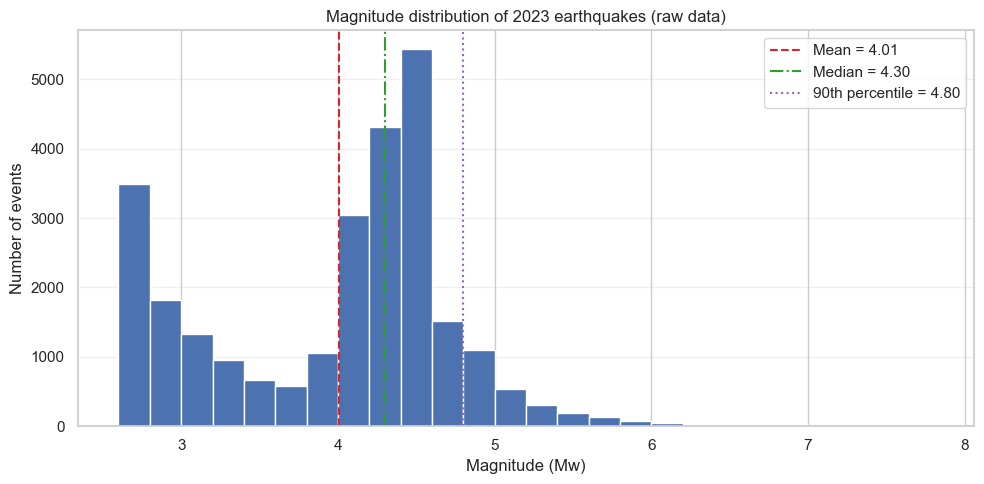

In [7]:

# --- magnitude distribution ---
mag = eq_df["mag"].dropna()

bin_width = 0.2
mag_min = mag.min()
mag_max = mag.max()
bins = np.arange(mag_min, mag_max + bin_width, bin_width)
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(mag, bins=bins)

mag_mean = mag.mean()
mag_median = mag.median()
mag_p90 = np.percentile(mag, 90)

ax.axvline(mag_mean, color="tab:red", linestyle="--", linewidth=1.5, label=f"Mean = {mag_mean:.2f}")
ax.axvline(mag_median, color="tab:green", linestyle="-.", linewidth=1.5, label=f"Median = {mag_median:.2f}")
ax.axvline(mag_p90, color="tab:purple", linestyle=":", linewidth=1.5, label=f"90th percentile = {mag_p90:.2f}")

ax.set_xlabel("Magnitude (Mw)")
ax.set_ylabel("Number of events")
ax.set_title("Magnitude distribution of 2023 earthquakes (raw data)")
ax.legend(loc="upper right")
ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 1. Magnitude distribution (raw).**

**2.3.7 Global depth distribution**

Depths are summarised to show shallow dominance and the presence of intermediate and deep events. Any clipping used here is purely for visualisation and does not define cleaning rules.

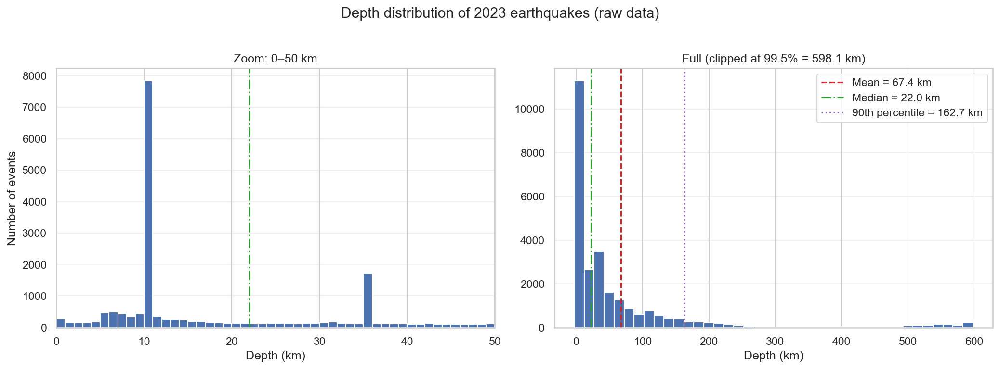

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# --- depth distribution ---
depth = eq_df["depth"].dropna()

#  if your dataset has many 0-depth placeholders, consider:
# depth = depth[depth > 0]

clip_val = np.percentile(depth, 99.5)
depth_plot = depth.clip(upper=clip_val)

depth_mean = depth_plot.mean()
depth_median = depth_plot.median()
depth_p90 = np.percentile(depth_plot, 90)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), dpi=150)

# Left: zoom into shallow depths (0–50 km)
zoom_max = 50
bins_zoom = np.arange(0, zoom_max + 1, 1)  # 1 km bins for clarity
ax1.hist(depth_plot[depth_plot <= zoom_max], bins=bins_zoom)
ax1.set_xlim(0, zoom_max)
ax1.set_xlabel("Depth (km)")
ax1.set_ylabel("Number of events")
ax1.set_title("Zoom: 0–50 km")
ax1.grid(axis="y", alpha=0.3)

# Right: full clipped distribution
ax2.hist(depth_plot, bins=40)
ax2.set_xlabel("Depth (km)")
ax2.set_title(f"Full (clipped at 99.5% = {clip_val:.1f} km)")
ax2.grid(axis="y", alpha=0.3)

# Add the same reference lines to both
for ax in (ax1, ax2):
    ax.axvline(depth_mean, color="tab:red", linestyle="--", linewidth=1.5, label=f"Mean = {depth_mean:.1f} km")
    ax.axvline(depth_median, color="tab:green", linestyle="-.", linewidth=1.5, label=f"Median = {depth_median:.1f} km")
    ax.axvline(depth_p90, color="tab:purple", linestyle=":", linewidth=1.5, label=f"90th percentile = {depth_p90:.1f} km")

ax2.legend(loc="upper right")
fig.suptitle("Depth distribution of 2023 earthquakes (raw data)", y=1.02)
plt.tight_layout()
plt.show()


**Figure 2. Depth distribution (raw).**

**2.3.8 Global spatial scatter sanity check**

A simple scatter plot checks that coordinates fall in valid ranges and that clusters broadly align with known tectonic structure (interpreted cautiously due to monitoring bias).

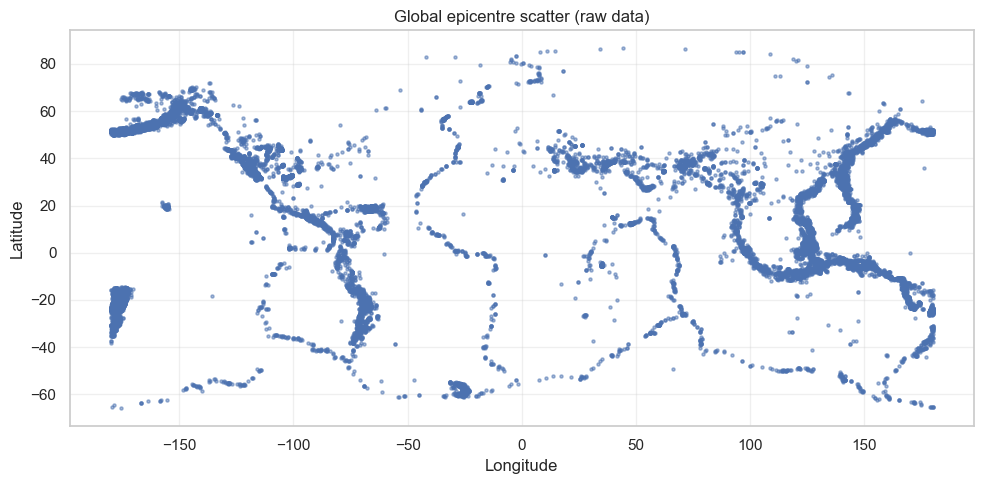

In [9]:

# --- epicentre scatter ---
lat = eq_df["latitude"].dropna()
lon = eq_df["longitude"].dropna()

fig, ax = plt.subplots(figsize=(10, 5))
ax.scatter(lon, lat, s=5, alpha=0.5)

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Global epicentre scatter (raw data)")
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


**Figure 3. Global epicentre scatter (raw).**

**2.3.9 Event type distribution**

The catalogue contains non-earthquake event types (e.g., quarry blasts). These are removed in the cleaning pipeline to avoid biasing distributions and models.

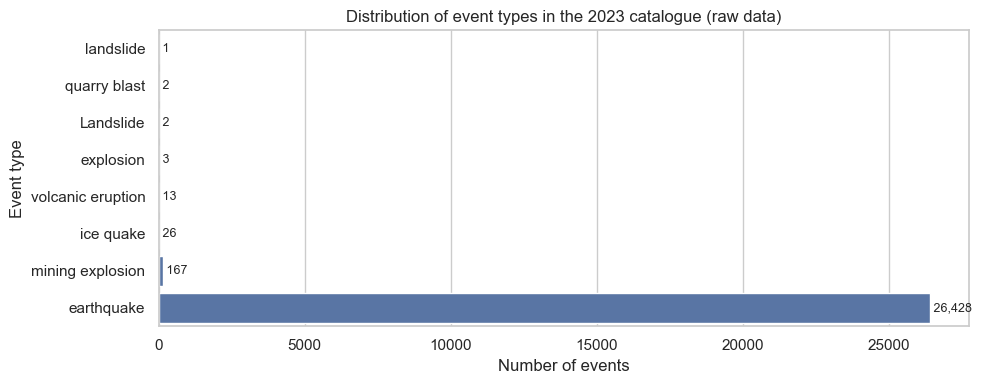

In [ ]:
# --- distribution of event types 
type_counts = (
    eq_df["type"]
    .value_counts(dropna=False)
    .sort_values(ascending=True)
)

n_types = len(type_counts)
fig_height = max(4, 0.4 * n_types)

fig, ax = plt.subplots(figsize=(10, fig_height))
sns.barplot(y=type_counts.index, x=type_counts.values, orient="h", ax=ax)

ax.set_xlabel("Number of events")
ax.set_ylabel("Event type")
ax.set_title("Distribution of event types in the 2023 catalogue (raw data)")

for i, count in enumerate(type_counts.values):
    ax.text(count, i, f" {count:,}", va="center", ha="left", fontsize=9)

plt.tight_layout()
plt.show()


**Figure 4. Event-type distribution (raw).**

---

## 3. Cleaning Pipeline

Reliable analysis requires consistent, physically plausible records. The cleaning pipeline:
- removes exact duplicates,
- standardises timestamp parsing,
- keeps the most recent record per event ID,
- enforces physically plausible bounds for latitude/longitude/depth/magnitude, and
- filters to events labelled as `type == 'earthquake'`.

Each step is logged with counts removed to maintain an audit trail.

**Table 3. Cleaning audit summary** records step-by-step row removal.  
**Table 4. Class balance after cleaning** highlights the rarity of strong events.


In [11]:


def clean_data(df, return_audit=False):
    """Clean the raw earthquake DataFrame: deduplicate records, coerce key fields,
    enforce physical bounds, and drop non earthquake event types. Returns a copy
    ready for downstream feature engineering."""
    df = df.copy()
    audit_rows = []

    def log_step(step, before, after, reason):
        removed = before - after
        removed_pct = (removed / before * 100) if before else 0
        audit_rows.append({
            "step": step,
            "n_before": before,
            "n_after": after,
            "removed": removed,
            "removed_pct": round(removed_pct, 2),
            "reason": reason,
        })

    # Drop exact duplicate rows first to get a stable baseline for all subsequent filters.
    before = len(df)
    df = df.drop_duplicates()
    log_step(
        "Drop exact duplicates",
        before,
        len(df),
        "Remove identical rows to avoid double-counting.",
    )
    print(f"Removed {before - len(df)} exact duplicate rows.")

    # Parse timestamps; invalid strings become NaT so date filters and sorting stay reliable.
    df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce", utc=True)

    # If multiple records share an earthquake ID, keep the most recently updated record.
    before = len(df)
    df = (
        df.sort_values("updated")
        .drop_duplicates(subset="id", keep="last")
    )
    log_step(
        "Keep latest per ID",
        before,
        len(df),
        "Keep only the most recent revision for each event ID.",
    )
    print(f"Removed {before - len(df)} rows with duplicate earthquake based on IDs.")

    # Standardise numeric fields so physical filters behave predictably.
    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    # Remove rows missing essential fields needed for downstream analysis.
    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]
    before = len(df)
    df = df.dropna(subset=essential_cols)
    log_step(
        "Drop missing essentials",
        before,
        len(df),
        f"Remove rows missing {', '.join(essential_cols)}.",
    )
    print(f"Removed {before - len(df)} rows with missing essential earthquake information in {essential_cols}.")

    # Enforce physically plausible latitude/longitude/depth/magnitude ranges.
    before = len(df)
    valid_lat = df["latitude"].between(-90, 90)
    valid_lon = df["longitude"].between(-180, 180)
    # Depths beyond ~700 km are exceedingly rare; trimming deeper values removes likely sensor errors.
    valid_depth = df["depth"].between(0, 700)
    valid_mag = df["mag"].between(0, 10)
    df = df[valid_lat & valid_lon & valid_depth & valid_mag]
    log_step(
        "Filter physical ranges",
        before,
        len(df),
        "Enforce latitude/longitude/depth/magnitude bounds.",
    )
    print(f"Removed {before - len(df)} rows with invalid geographical ranges.")

    if "type" in df.columns:
        # Keep only earthquake events, dropping blasts/quarry events and other non earthquake records.
        before = len(df)
        df = df[df["type"] == "earthquake"]
        log_step(
            "Keep earthquake type",
            before,
            len(df),
            "Filter to events labeled as earthquakes only.",
        )
        print(f"Removed {before - len(df)} non earthquake events.")

    if return_audit:
        audit_df = pd.DataFrame(audit_rows)
        return df, audit_df

    return df


# Cleaning pipeline: operate on a copy, remove exact duplicates, coerce timestamps, keep the most
# recent record per earthquake ID, convert key numerics, drop rows missing essentials, enforce
# geographic and magnitude bounds, and retain only rows labeled as earthquakes to form a reliable
# base table.


`clean_data()` removes duplicates and invalid rows while logging each step, producing an auditable summary of how the dataset changes during cleaning.

In [12]:
from IPython.display import Markdown

print('Raw dataset shape:', eq_df.shape)

if "pipeline" in globals():
    pipeline.clean_fn = clean_data
    cleaned_result = pipeline.clean(eq_df, return_audit=True)
else:
    cleaned_result = clean_data(eq_df, return_audit=True)

if isinstance(cleaned_result, tuple):
    df_clean, cleaning_audit_df = cleaned_result
else:
    df_clean = cleaned_result
    cleaning_audit_df = pd.DataFrame()

cleaned_eq_df = df_clean

print('Cleaned dataset shape:', cleaned_eq_df.shape)
cleaned_eq_df.info()
preview_table(cleaned_eq_df)

if isinstance(cleaning_audit_df, pd.DataFrame) and not cleaning_audit_df.empty:
    audit_display = cleaning_audit_df.copy()
    audit_display.columns = [c.replace('_', ' ') for c in audit_display.columns]
    display(Markdown("**Table 3. Cleaning audit summary**"))
    display(audit_display)
    cleaning_audit_path = TABLES_DIR / "cleaning_audit.csv"
    cleaning_audit_df.to_csv(cleaning_audit_path, index=False)
    print(f"Saved cleaning audit to {cleaning_audit_path}")

cleaned_csv_path = PROCESSED_DIR / "Earthquakes 2023 clean.csv"
cleaned_eq_df.to_csv(cleaned_csv_path, index=False)
print(f"Saved cleaned dataset to {cleaned_csv_path}")

strong_mask = cleaned_eq_df.get('is_strong_quake', cleaned_eq_df['mag'] >= 6.0)
strong_count = int(strong_mask.sum())
class_summary = pd.DataFrame({
    'Cleaned Records': [len(cleaned_eq_df)],
    'Strong Quakes (>=6.0)': [strong_count],
})
class_summary['Percentage Strong'] = (class_summary['Strong Quakes (>=6.0)'] / class_summary['Cleaned Records'] * 100).round(2)
print("\nClass balance after cleaning:")
display(Markdown("**Table 4. Class balance after cleaning**"))
display(class_summary)


Raw dataset shape: (26642, 22)
Removed 1960 exact duplicate rows.
Removed 0 rows with duplicate earthquake based on IDs.
Removed 0 rows with missing essential earthquake information in ['time', 'latitude', 'longitude', 'depth', 'mag'].
Removed 43 rows with invalid geographical ranges.
Removed 207 non earthquake events.
Cleaned dataset shape: (24432, 22)
<class 'pandas.core.frame.DataFrame'>
Index: 24432 entries, 19 to 18434
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             24432 non-null  datetime64[ns, UTC]
 1   latitude         24432 non-null  float64            
 2   longitude        24432 non-null  float64            
 3   depth            24432 non-null  float64            
 4   mag              24432 non-null  float64            
 5   magType          24432 non-null  object             
 6   nst              23051 non-null  float64            
 7   gap         

**Table 3. Cleaning audit summary**

,step,n before,n after,removed,removed pct,reason
0,Drop exact duplicates,26642,24682,1960,7.36,Remove identical rows to avoid double-counting.
1,Keep latest per ID,24682,24682,0,0.00,Keep only the most recent revision for each ev...
2,Drop missing essentials,24682,24682,0,0.00,"Remove rows missing time, latitude, longitude,..."
3,Filter physical ranges,24682,24639,43,0.17,Enforce latitude/longitude/depth/magnitude bou...
4,Keep earthquake type,24639,24432,207,0.84,Filter to events labeled as earthquakes only.


Saved cleaning audit to E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis\Data\Processed\Tables\cleaning_audit.csv
Saved cleaned dataset to E:\Master Degree\1º semester\Python Notebooks and Scripting\earthquake-data-analysis\Data\Processed\Earthquakes 2023 clean.csv

Class balance after cleaning:


**Table 4. Class balance after cleaning**

,Cleaned Records,Strong Quakes (>=6.0),Percentage Strong
0,24432,146,0.6


**3.1: Cleaning impact and class balance**

After cleaning, **24,432 earthquakes remain**, with **146 strong events (Mw ≥ 6.0), ~0.6%**. This extreme class imbalance is central to the modelling strategy and evaluation: accuracy alone would be misleading, so precision-recall behaviour is prioritised.

The cleaning removes a small fraction of records overall, suggesting the raw catalogue is already relatively structured; however, filtering non-earthquake events and physically implausible outliers is still necessary for scientific validity.

---

## 4. Feature Engineering

Feature engineering enriches the cleaned dataset with temporal, spatial, depth-class, and quality-diagnostic context. The key design rule is **separating analysis features from modelling features**:
- Some derived fields (e.g., energy proxies derived directly from magnitude) can be useful for interpretation and plots, but must be excluded from model predictors to avoid leakage when the target is defined by magnitude.


### 4.1 Design of the `engineer_features()` Function

The engineered features map to interpretable concepts:
- **Temporal:** month, season, part of day (descriptive, not causal).
- **Depth class:** shallow / intermediate / deep categories to reflect tectonic regimes.
- **Coarse spatial context:** hemisphere and broad longitude-based region bins (contextual, not deterministic).
- **Quality diagnostics:** composite indicators summarising uncertainty fields, used to interpret reliability and potential measurement bias.

**Leakage control:** any feature that directly encodes or is derived from the target definition (Mw thresholding) is excluded from model training predictors.

In [13]:


import numpy as np
import pandas as pd
from pandas.api.types import is_datetime64_any_dtype, CategoricalDtype

def engineer_features(df: "pd.DataFrame") -> "pd.DataFrame":
    """Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe."""
    df = df.copy()


    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)

    dt = df["time"].dt
    df["time_str"] = dt.strftime("%Y-%m-%d %H:%M:%S")
    df["year"] = dt.year
    df["month"] = dt.month
    df["month_name"] = dt.month_name()
    df["day"] = dt.day
    df["day_of_week"] = dt.dayofweek
    df["day_name"] = dt.day_name()
    df["hour"] = dt.hour
    df["is_weekend"] = df["day_of_week"].isin([5, 6])

    def hour_to_part(h):
        if h < 6:   return "night"
        if h < 12:  return "morning"
        if h < 18:  return "afternoon"
        return "evening"
    df["part_of_day"] = df["hour"].apply(hour_to_part)

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"
        if m in (3, 4, 5):   return "spring"
        if m in (6, 7, 8):   return "summer"
        return "autumn"
    df["season"] = df["month"].apply(month_to_season)


    depth_cat_type = CategoricalDtype(categories=["shallow", "intermediate", "deep"], ordered=True)
    mag_cat_type = CategoricalDtype(categories=["minor", "light", "moderate", "strong", "major", "great", "massive"], ordered=True)
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=depth_cat_type.categories,
        right=False
    ).astype(depth_cat_type)
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=mag_cat_type.categories,
        right=False
    ).astype(mag_cat_type)
    df["is_strong_quake"] = df["mag"] >= 6.0
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8


    df["abs_latitude"] = df["latitude"].abs()
    df["abs_longitude"] = df["longitude"].abs()
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")

    def classify_region(lon):
        if lon < -100: return "Americas_west"
        if lon < -30:  return "Americas_east_Atlantic"
        if lon < 60:   return "Europe_Africa"
        if lon < 150:  return "Asia_WestPacific"
        return "Pacific_Oceania"
    df["broad_region"] = df["longitude"].apply(classify_region)


    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"
                df[norm_name] = (df[col] - mn) / (mx - mn)
                norm_cols.append(norm_name)
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)


    category_types = {
        "depth_category": depth_cat_type,
        "mag_category": mag_cat_type,
        "hemisphere_NS": CategoricalDtype(categories=["north", "south"]),
        "hemisphere_EW": CategoricalDtype(categories=["east", "west"]),
        "broad_region": CategoricalDtype(categories=["Americas_west", "Americas_east_Atlantic", "Europe_Africa", "Asia_WestPacific", "Pacific_Oceania"]),
        "part_of_day": CategoricalDtype(categories=["night", "morning", "afternoon", "evening"], ordered=True),
        "season": CategoricalDtype(categories=["winter", "spring", "summer", "autumn"], ordered=True),
    }
    for col, cat_type in category_types.items():
        if col in df.columns:
            df[col] = df[col].astype(cat_type)

    for c in category_types:
        if c in df.columns and hasattr(df[c], "cat"):
            cat_series = df[c]
            if "unknown" not in cat_series.cat.categories:
                cat_series = cat_series.cat.add_categories(["unknown"])
            df[c] = cat_series
            df[f"{c}_code"] = cat_series.fillna("unknown").cat.codes

    return df


# Feature engineering steps: add temporal fields (year, month, season, part of day), physical
# severity (depth and magnitude categories, energy proxy, strong flag), geographic context
# (hemispheres, coarse region, distances to equator and prime meridian), data-quality signals
# (error presence, normalized scores, composite quality), and categorical encodings for modelling.


if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features


The `engineer_features()` step adds columns without dropping rows, supporting traceability for later EDA and modelling.

### 4.2 Engineered Feature Schema Summary

This section reports which engineered features exist, their dtypes, and missingness to confirm the pipeline added features without dropping rows.

In [14]:

if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features
    df_feat = pipeline.engineer(cleaned_eq_df)
else:
    df_feat = engineer_features(cleaned_eq_df)

featured_eq_df = df_feat

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}

print("Engineered Feature Schema Summary\n(showing only columns present in featured_eq_df)\n")

for group, cols in schema_groups.items():
    present = [c for c in cols if c in featured_eq_df.columns]
    missing = [c for c in cols if c not in featured_eq_df.columns]

    print(f"## {group} ({len(present)}/{len(cols)} present)")
    if present:
        dtypes = featured_eq_df[present].dtypes.astype(str)
        for c in present:
            na = int(featured_eq_df[c].isna().sum())
            print(f"  - {c}: {dtypes[c]} (missing={na})")
    else:
        print("  (none present)")

    if missing:
        print(f"  Missing (not in df): {missing}")
    print()

Engineered Feature Schema Summary
(showing only columns present in featured_eq_df)

## Temporal (5/5 present)
  - year: int32 (missing=0)
  - month: int32 (missing=0)
  - season: category (missing=0)
  - part_of_day: category (missing=0)
  - is_weekend: bool (missing=0)

## Physical (4/4 present)
  - depth_category: category (missing=0)
  - mag_category: category (missing=0)
  - is_strong_quake: bool (missing=0)
  - energy_log10_J: float64 (missing=0)

## Spatial (4/4 present)
  - hemisphere_NS: category (missing=0)
  - hemisphere_EW: category (missing=0)
  - broad_region: category (missing=0)
  - distance_from_equator_km: float64 (missing=0)

## Quality (4/4 present)
  - quality_score: float64 (missing=0)
  - gap_norm: float64 (missing=1382)
  - rms_norm: float64 (missing=0)
  - has_depthError: bool (missing=0)

## ML Encodings (4/4 present)
  - depth_category_code: int8 (missing=0)
  - mag_category_code: int8 (missing=0)
  - season_code: int8 (missing=0)
  - part_of_day_code: int8 (m

### 4.3 Feature Engineering Pipeline

The engineered dataset expands the cleaned table to include additional features while keeping the same row count, supporting reproducibility and traceability.

**Table 5. Engineered dataset preview.**

In [15]:

print("Applying feature engineering to cleaned_eq_df...")

original_columns = list(cleaned_eq_df.columns)

if "pipeline" in globals():
    pipeline.engineer_fn = engineer_features
    df_feat = pipeline.engineer(cleaned_eq_df)
else:
    df_feat = engineer_features(cleaned_eq_df)

featured_eq_df = df_feat

print("=== Dataset Shape Comparison ===")
print(f"Before feature engineering : {cleaned_eq_df.shape}")
print(f"After feature engineering  : {featured_eq_df.shape}")

new_cols = [c for c in featured_eq_df.columns if c not in original_columns]

print(f"Number of engineered features added: {len(new_cols)}")
print("Sample of engineered feature names (first 20):")
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")

print("Preview of engineered dataframe:")
preview_table(featured_eq_df)


# Run the feature pipeline on the cleaned dataset; compare shapes before/after, count newly added
# columns, sample their names, and preview rows to confirm readiness for Section 5 (EDA) and Section 6 (modelling) analyses.


Applying feature engineering to cleaned_eq_df...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 60)
Number of engineered features added: 38
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
  - hemisphere_NS
Preview of engineered dataframe:


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magError norm,horizontalError norm,quality score,depth category code,mag category code,hemisphere NS code,hemisphere EW code,broad region code,part of day code,season code
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,0.028210,0.008788,0.837641,0,0,0,1,1,1,0
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,0.041231,0.002727,0.924656,0,0,0,1,1,1,0
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,0.017817,0.036768,0.703399,0,1,0,1,1,3,0
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,0.021568,0.003434,0.873287,0,0,0,1,1,0,0
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,0.023183,0.012828,0.842688,0,0,0,1,1,1,0


The engineered dataset keeps the same row count, confirming features were added without dropping events. The preview and shape checks support traceability.

These checks create an audit trail so later model shifts can be traced back to feature design rather than accidental data loss.

### 4.4 Overview of Engineered Feature Groups

A four-panel dashboard provides a sanity check of seasonality, magnitude categories, regional counts, and quality score distribution. This is a high-level validation step and can hide regional detail, so deeper EDA follows.

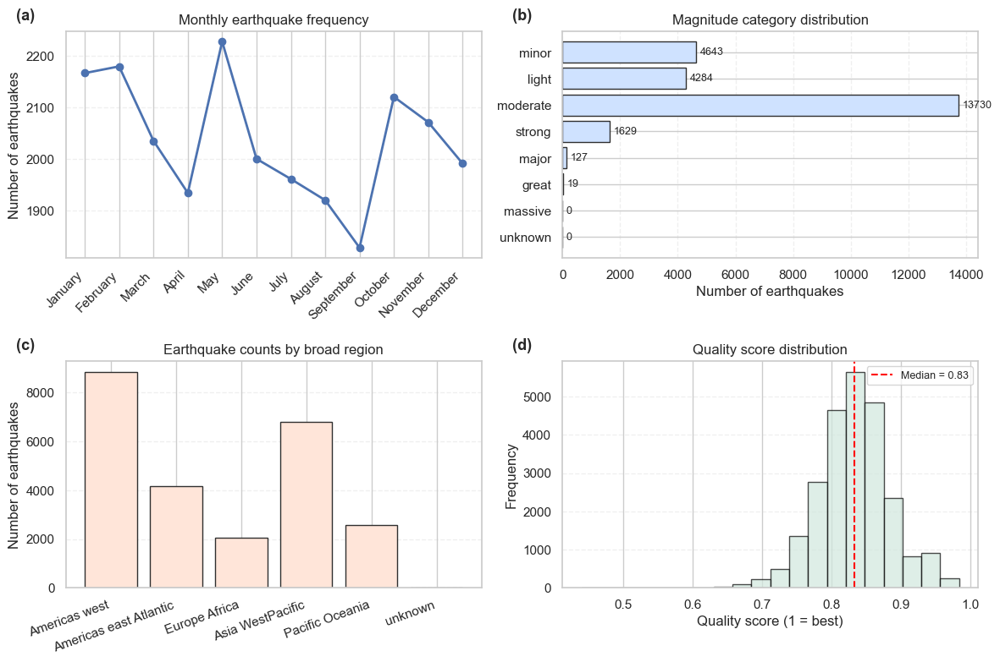

In [16]:

plt = libs.plt
np = libs.np

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
labels = ['(a)', '(b)', '(c)', '(d)']


order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
month_counts = (
    featured_eq_df["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)
x = np.arange(len(order_months))
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)
axes[0].set_title("Monthly earthquake frequency", fontsize=12)
axes[0].set_xticks(x)
axes[0].set_xticklabels(order_months, rotation=45, ha="right")
axes[0].set_ylabel("Number of earthquakes")
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")


mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)
y_pos = np.arange(len(mag_counts))
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(mag_counts.index.astype(str))
axes[1].invert_yaxis()
axes[1].set_title("Magnitude category distribution", fontsize=12)
axes[1].set_xlabel("Number of earthquakes")
axes[1].grid(axis="x", linestyle="--", alpha=0.3)
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)


region_counts = (
    featured_eq_df["broad_region"]
    .value_counts()
    .sort_index()
)
x2 = np.arange(len(region_counts))
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")
axes[2].set_xticks(x2)
region_labels = [label.replace("_", " ") for label in region_counts.index.astype(str)]
axes[2].set_xticklabels(region_labels, rotation=20, ha="right")
axes[2].set_title("Earthquake counts by broad region", fontsize=12)
axes[2].set_ylabel("Number of earthquakes")
axes[2].grid(axis="y", linestyle="--", alpha=0.3)
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")


ax = axes[3]
if "quality_score" in featured_eq_df.columns:
    qs = featured_eq_df["quality_score"].dropna()
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")
    median_qs = qs.median()
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")
    ax.set_title("Quality score distribution", fontsize=12)
    ax.set_xlabel("Quality score (1 = best)")
    ax.set_ylabel("Frequency")
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(fontsize=9)
else:
    ax.text(0.5, 0.5, "Quality score not available",
            ha="center", va="center", fontsize=11)
    ax.axis("off")
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()


# Four-panel overview: (a) monthly seasonality, (b) magnitude category distribution, (c) counts by
# broad region, and (d) data-quality distribution. Provides a dashboard snapshot before deeper
# dimension-specific analysis.



**Figure 5. Engineered feature groups overview.**


The dashboard provides a high-level overview that is useful for sanity checks but can hide regional detail, so deeper EDA follows.

Counts and broad patterns are interpreted cautiously because uneven sensor coverage can influence apparent activity (monitoring bias).

### 4.5 Additional Feature-Level Visualisations

This section provides additional plots that validate engineered feature behaviour and connect depth, magnitude, and geography.

#### 4.5.1 Magnitude severity profile

Magnitude categories are heavily skewed toward smaller events, consistent with earthquake catalogues and detection completeness.

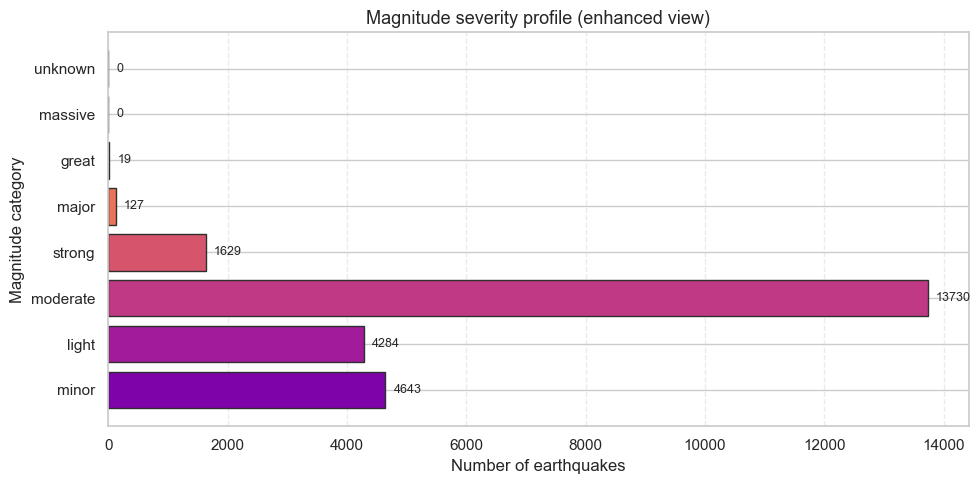

In [17]:

plt = libs.plt
np = libs.np

mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))

plt.figure(figsize=(10, 5))
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)
plt.xlabel("Number of earthquakes")
plt.ylabel("Magnitude category")
plt.grid(axis="x", linestyle="--", alpha=0.4)


for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()


# Magnitude severity profile: horizontal view of counts per seismological category to
# contextualise subsequent depth and regional comparisons.



**Figure 6. Magnitude severity profile.**


The dataset exhibits a heavy skew toward small events. This distribution validates the project's decision to classify them into group rather than predict exact sizes, which would be biased by the overwhelming number of small-sized quakes.



#### 4.5.2 Magnitude distribution by depth category

This visualisation compares magnitude distributions across shallow, intermediate, and deep classes to capture depth-related differences.

Depth categories show structural differences: shallow events span a wider magnitude range, while deep events cluster more tightly. This supports depth class as a useful contextual feature.



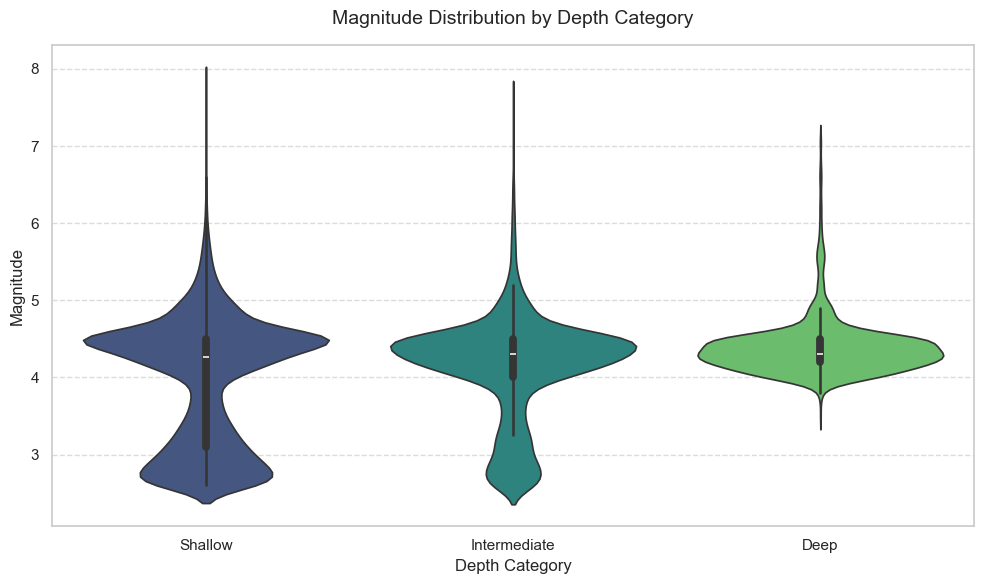

In [18]:
plt = libs.plt
sns = libs.sns
np = libs.np

def assign_depth_category(depth):
    if depth <= 70:
        return 'Shallow'
    elif depth <= 300:
        return 'Intermediate'
    else:
        return 'Deep'

if 'depth_category' not in eq_df.columns:
    eq_df['depth_category'] = eq_df['depth'].apply(assign_depth_category)

fig, ax = plt.subplots(figsize=(10, 6))

depth_order = ['Shallow', 'Intermediate', 'Deep']

sns.violinplot(
    data=eq_df,
    x='depth_category',
    y='mag',
    order=depth_order,
    palette='viridis',  
    inner='box',        
    ax=ax
)

ax.set_title('Magnitude Distribution by Depth Category', fontsize=14, pad=15)
ax.set_xlabel('Depth Category', fontsize=12)
ax.set_ylabel('Magnitude', fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

**Figure 7. Magnitude distribution by depth category.**


#### 4.5.3 Global epicentre distribution with magnitude-depth

A composite map overlays epicentres and tectonic boundaries to anchor analysis in physical geography, while acknowledging monitoring bias.

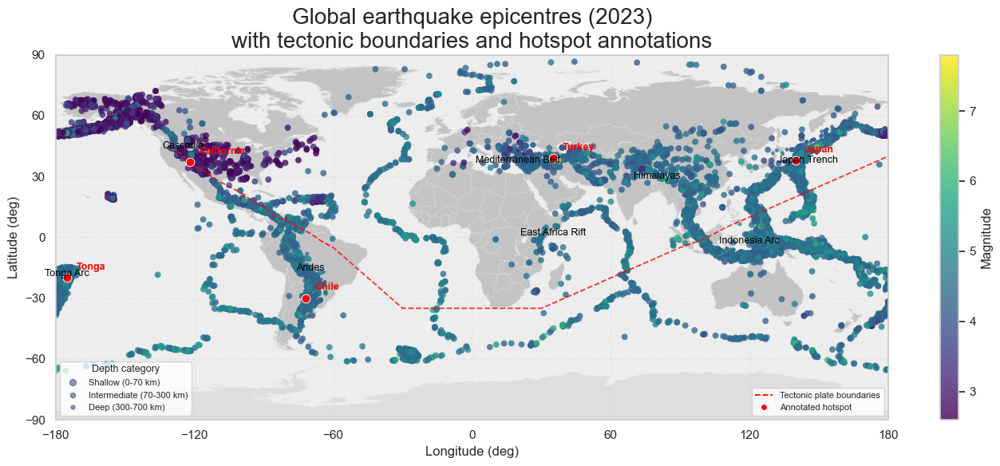

In [19]:

plt = libs.plt
mpimg = libs.mpimg
np = libs.np
pd = libs.pd
Line2D = libs.Line2D

map_path = libs.WORLD_MAP_FILE
plates_path = libs.PLATE_FILE

cropped_img = None
if mpimg is not None and map_path is not None and map_path.exists():
    try:
        img = mpimg.imread(map_path)
        rgb = img[:, :, :3]
        brightness = rgb.mean(axis=2)
        mask = brightness > 0.02
        if mask.any():
            rows = np.where(mask.any(axis=1))[0]
            cols = np.where(mask.any(axis=0))[0]
            cropped_img = np.clip(img[rows[0]:rows[-1], cols[0]:cols[-1]] * 0.9, 0, 1)
    except Exception as exc:
        print(f"Skipping background image: {exc}")
else:
    print("World map image not found; drawing map without a background image.")

plates = None
if plates_path is not None and plates_path.exists():
    try:
        plates = pd.read_csv(plates_path)
    except Exception as exc:
        print(f"Skipping plate boundary overlay: {exc}")
else:
    print("Plate boundary file not found; continuing without boundary overlay.")

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}
marker_sizes = (
    featured_eq_df["depth_category"]
    .map(size_map)
    .astype(float)
    .fillna(14.0)
)

fig, ax = plt.subplots(figsize=(14, 6))

if cropped_img is not None:
    ax.imshow(
        cropped_img,
        extent=[-180, 180, -90, 90],
        aspect="auto",
        alpha=0.75,
        zorder=0,
    )

sc = ax.scatter(
    featured_eq_df["longitude"],
    featured_eq_df["latitude"],
    c=featured_eq_df["mag"],
    s=marker_sizes,
    alpha=0.8,
    cmap="viridis",
    edgecolors="none",
    zorder=2,
)

if plates is not None:
    ax.plot(
        plates["lon"], plates["lat"],
        color="red", linewidth=1.3, linestyle="--",
        alpha=0.8, zorder=3,
    )

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),
    "California": (-122, 37),
}

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)
    ax.text(
        x + 4, y + 4,
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5,
    )

tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )

ax.set_title(
    "Global earthquake epicentres (2023)\nwith tectonic boundaries and hotspot annotations",
    fontsize=20,
)
ax.set_xlabel("Longitude (deg)")
ax.set_ylabel("Latitude (deg)")
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.set_xticks(np.arange(-180, 181, 60))
ax.set_yticks(np.arange(-90, 91, 30))
ax.grid(True, linestyle="--", alpha=0.25)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Magnitude")

depth_legend_elements = [
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["shallow"]),
           label='Shallow (0-70 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["intermediate"]),
           label='Intermediate (70-300 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["deep"]),
           label='Deep (300-700 km)', markerfacecolor='grey', alpha=0.8),
]

depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True,
)
ax.add_artist(depth_legend)

boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3, label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white", label="Annotated hotspot"),
    ],
    loc="lower right",
    fontsize=8,
    frameon=True,
)

plt.tight_layout()
plt.show()

# World map composite: load optional background and plate-boundary overlays when available,
# crop and dim the map for clarity, overlay epicentres sized by depth bucket and colored by
# magnitude, annotate hotspots and tectonic provinces, and include legends for depth and
# boundary layers while remaining resilient if assets are missing.


**Figure 8. Epicentres with tectonic boundaries.**


### 4.6 Summary and Reflection

Feature engineering adds interpretable context without altering event rows. The resulting dataset supports both EDA and baseline classification. However, broad spatial bins and catalogue-derived uncertainty fields are limited approximations: they support interpretation but cannot replace geological features such as distance to plate boundaries or slab geometry.

---

## 5. Exploratory Data Analysis

EDA synthesises global patterns, depth-magnitude structure, and regional contrasts. Emphasis is placed on visible evidence (maps, distributions, correlations, and diagnostic checks) and on caution: recorded patterns may partially reflect detection thresholds and sensor coverage.


Global patterns are examined through distributions, station-coverage diagnostics, and temporal reporting checks to establish a reliable baseline before multivariate and regional analysis.

### 5.1 Global Patterns

Global patterns are summarised through magnitude/depth distributions, station-coverage diagnostics, and temporal reporting checks.

In [20]:

print("Library availability (inline helper):")
print(libs.availability())


# Dependency status printout indicating which optional libraries are available to choose between
# interactive Plotly outputs and static matplotlib/seaborn fallbacks.



Library availability (inline helper):
{'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


**5.1.1: EDA dependency status**

Dependency checks ensure EDA outputs remain reproducible across environments, with interactive or static fallbacks as needed.

**5.1.2: Magnitude density by depth category (KDE)**


Shallow earthquakes cover a wider magnitude range, while deep events rarely approach the strong-event threshold. Overlap remains substantial, motivating multivariate modelling.


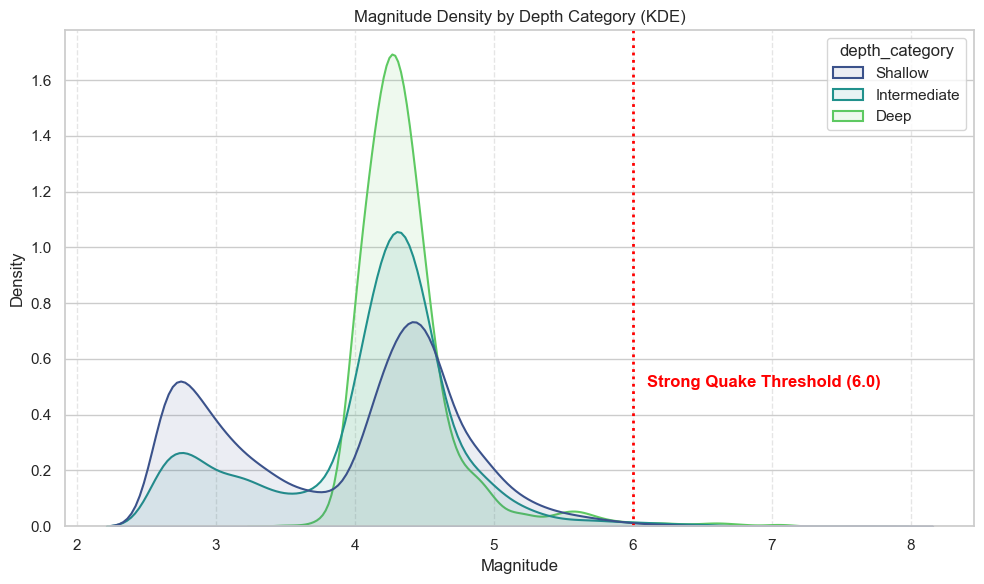

In [21]:
plt = libs.plt
sns = libs.sns

featured_eq_df['depth_category'] = featured_eq_df['depth_category'].str.capitalize()
depth_order = ['Shallow', 'Intermediate', 'Deep']

fig, ax = plt.subplots(figsize=(10, 6))

sns.kdeplot(
    data=featured_eq_df,
    x='mag',
    hue='depth_category',
    hue_order=depth_order,
    palette='viridis',
    common_norm=False,   
    linewidth=1.5,        
    fill=True,           
    alpha=0.1,          
    ax=ax
)

ax.axvline(6.0, color='red', linestyle=':', linewidth=2)
ax.text(x=6.1, y=0.5, s="Strong Quake Threshold (6.0)", color='red', fontweight='bold')

ax.set_title('Magnitude Density by Depth Category (KDE)')
ax.set_xlabel('Magnitude')
ax.set_ylabel('Density')
ax.grid(axis='x', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

**Figure 9. Magnitude density by depth category (KDE).**

**5.1.3: Depth distribution sanity check**

Depth histograms confirm shallow dominance and validate the cleaning bounds.

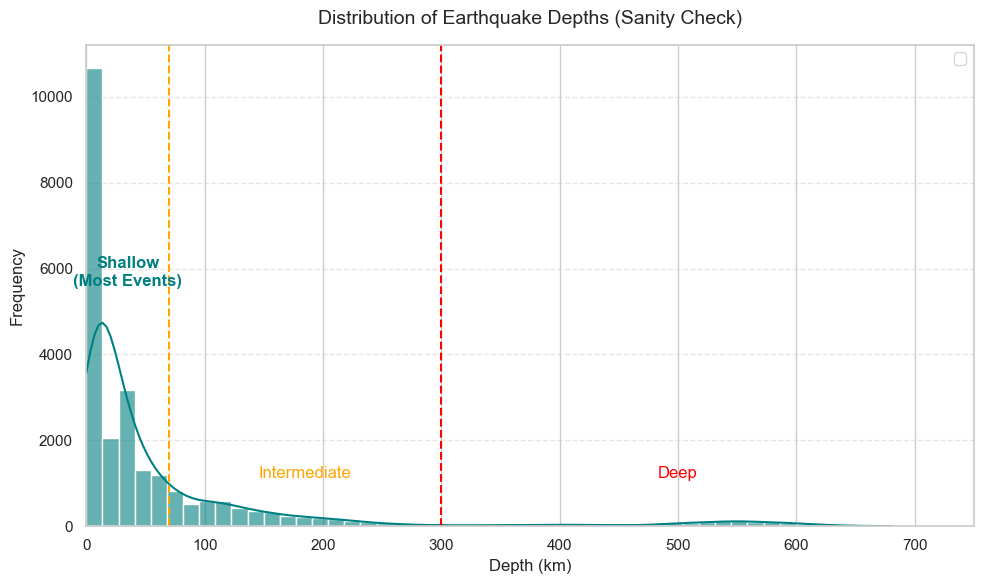

In [22]:
plt = libs.plt
sns = libs.sns

fig, ax = plt.subplots(figsize=(10, 6))

sns.histplot(
    data=featured_eq_df,
    x='depth',
    bins=50,             
    kde=True,
    color='teal',        
    alpha=0.6,
    edgecolor=None,
    ax=ax
)

ax.axvline(70, color='orange', linestyle='--', linewidth=1.5)
ax.axvline(300, color='red', linestyle='--', linewidth=1.5)

ax.text(35, ax.get_ylim()[1]*0.5, "Shallow\n(Most Events)", color='teal', ha='center', fontweight='bold')
ax.text(185, ax.get_ylim()[1]*0.1, "Intermediate", color='orange', ha='center')
ax.text(500, ax.get_ylim()[1]*0.1, "Deep", color='red', ha='center')

ax.set_title('Distribution of Earthquake Depths (Sanity Check)', fontsize=14, pad=15)
ax.set_xlabel('Depth (km)', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.set_xlim(0, 750)  # visually confirms we stopped at 700km
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

**Figure 10. Depth distribution sanity check.**


**5.1.4: Station count distributions**

Station counts (nst, magNst) provide a proxy for observational support, but they are influenced by network density.

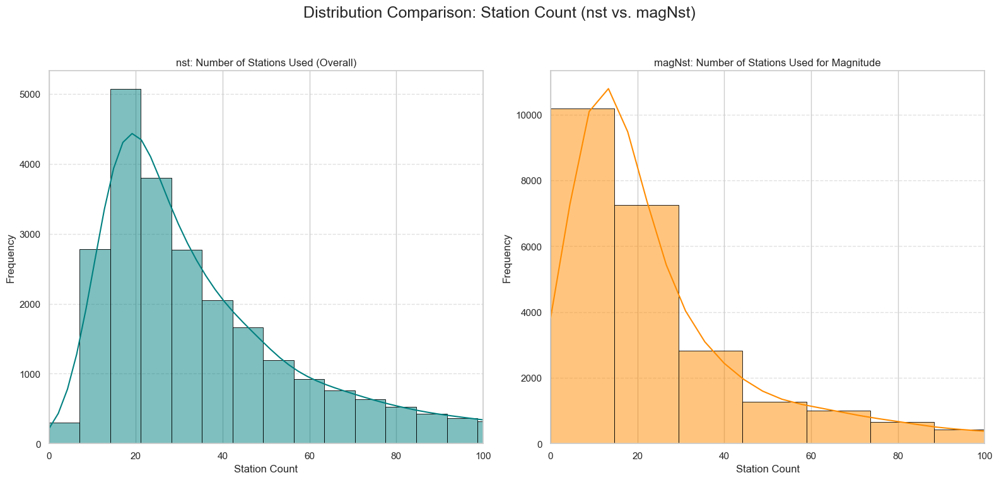

In [23]:
nst_data = eq_df['nst'].dropna()
magNst_data = eq_df['magNst'].dropna()

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)

max_limit = 100
bins_count = 60

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)
axes[0].set_title('nst: Number of Stations Used (Overall)')
axes[0].set_xlabel('Station Count')
axes[0].set_ylabel('Frequency')
axes[0].set_xlim(0, max_limit)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)
axes[1].set_title('magNst: Number of Stations Used for Magnitude')
axes[1].set_xlabel('Station Count')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, max_limit)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Station coverage check: compare `nst` (location stations) against `magNst` (magnitude stations)
# to assess network support and identify long tails linked to measurement quality.



**Figure 11. Station-coverage diagnostics.**


**5.1.5: Nearest station distance distribution**

The long tail of distance-to-nearest-station reflects remote events and uneven monitoring coverage.

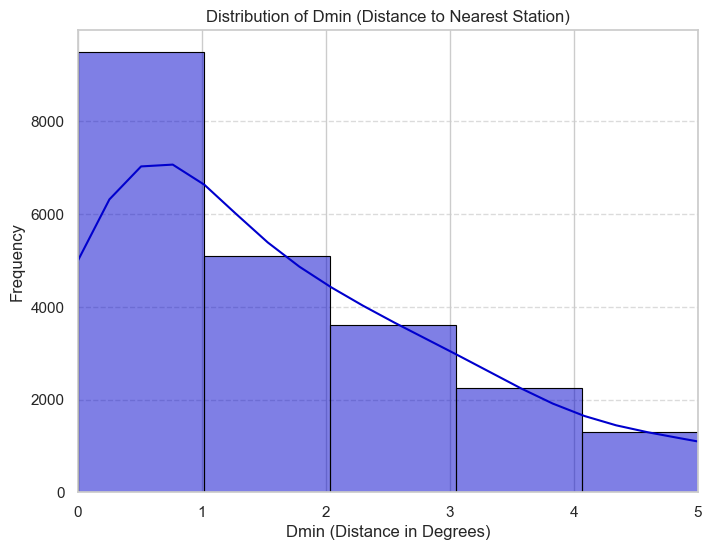

In [24]:
dmin_data = eq_df['dmin'].dropna()

plt = libs.plt
sns = libs.sns

plt.figure(figsize=(8, 6))

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)

plt.xlim(0, 5)

plt.title('Distribution of Dmin (Distance to Nearest Station)')
plt.xlabel('Dmin (Distance in Degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Nearest-station distance (`dmin`) distribution with histogram and KDE to understand sensor
# proximity and potential impact on measurement reliability.



**Figure 12. Nearest-station distance distribution.**

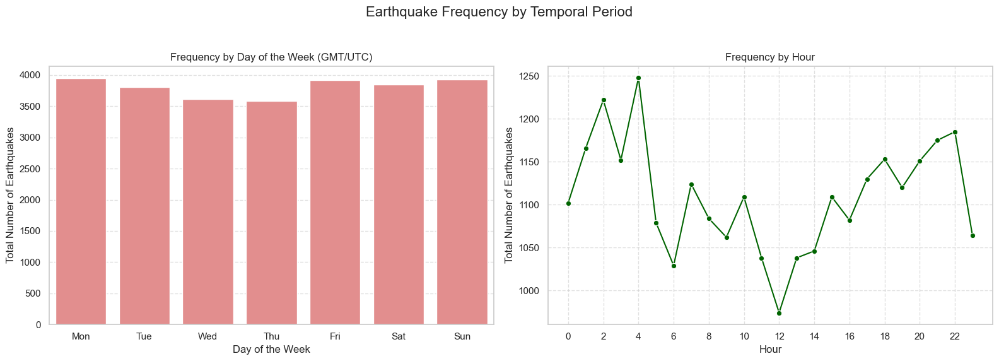

In [25]:
eq_df['time'] = pd.to_datetime(eq_df['time'])
eq_df['day_of_week'] = eq_df['time'].dt.dayofweek
eq_df['hour_of_day'] = eq_df['time'].dt.hour

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_counts = eq_df['day_of_week'].value_counts().sort_index()

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Total Number of Earthquakes')
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(day_labels)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

hour_counts = eq_df['hour_of_day'].value_counts().sort_index()
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')
axes[1].set_title('Frequency by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Total Number of Earthquakes')
axes[1].set_xticks(range(0, 24, 2))
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Temporal frequency: counts by weekday and hour (UTC) to reveal logging patterns before linking
# time signals to physical characteristics.



**Figure 13. Temporal reporting patterns.**


**5.1.6: Temporal event frequency (weekday and hour)**

Weekday/hour counts are broadly stable, supporting the catalogue as a reasonably consistent one-year snapshot.


### 5.2 Multivariate & Regional

These plots explore interactions among magnitude, depth, region, and quality to inform feature selection.

#### 5.2.1 Inter-feature correlation

Correlations among uncertainty metrics suggest these fields behave as a related group. Magnitude-depth correlation is weak, indicating simple linear rules are insufficient.


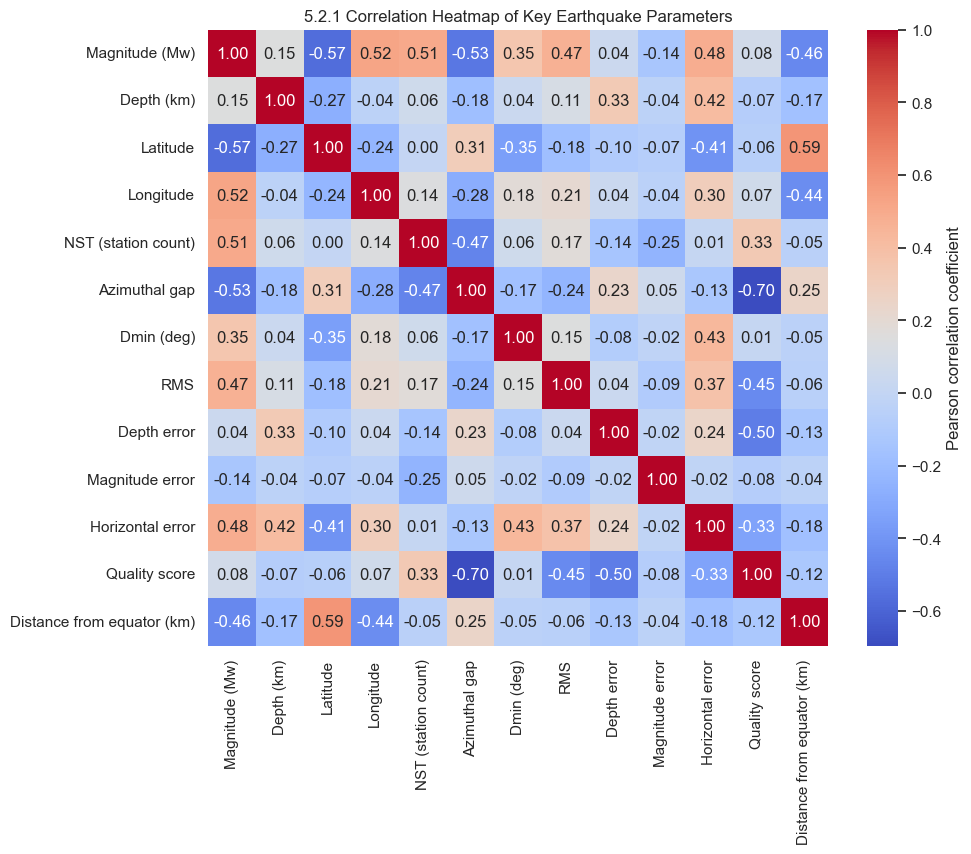

In [26]:
pd = libs.pd
plt = libs.plt
sns = libs.sns

df = globals().get('featured_eq_df', globals().get('eq_df'))

correlation_features = [
    'mag',
    'depth',
    'latitude',
    'longitude',
    'nst',
    'gap',
    'dmin',
    'rms',
    'depthError',
    'magError',
    'horizontalError',
    'quality_score',
    'distance_from_equator_km'  # Engineered feature
]

present_features = [f for f in correlation_features if f in df.columns]

label_map = {
    'mag': 'Magnitude (Mw)',
    'depth': 'Depth (km)',
    'latitude': 'Latitude',
    'longitude': 'Longitude',
    'nst': 'NST (station count)',
    'gap': 'Azimuthal gap',
    'dmin': 'Dmin (deg)',
    'rms': 'RMS',
    'depthError': 'Depth error',
    'magError': 'Magnitude error',
    'horizontalError': 'Horizontal error',
    'quality_score': 'Quality score',
    'distance_from_equator_km': 'Distance from equator (km)',
}

corr_matrix = df[present_features].corr()
corr_matrix = corr_matrix.rename(index=label_map, columns=label_map)

plt.figure(figsize=(10, 8))

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    cbar_kws={'label': 'Pearson correlation coefficient'}
)

plt.title('5.2.1 Correlation Heatmap of Key Earthquake Parameters')
plt.show()

# get is safety net to make sure notebook is more flexible.  Looks in 2 different places to ensure there is no crash if all cells are not running.
#1st - df with extra engineered features 2nd(fallback) - original df
#variable list of all corellation features
#List comprehension that loops through every corellation_feature - cleaner than a standard for loop



**Figure 14. Correlation heatmap.**  


The modest correlations suggest limited linear redundancy, although non-linear dependencies may still exist and can be captured by tree-based models. Magnitude-depth comparisons below clarify overlap directly.

#### 5.2.2 Magnitude vs Depth

Scatter and depth-class distributions show large overlap with non-linear boundaries, motivating tree-based models for baseline classification.

**Table 6. Summary from the depth vs magnitude analysis** quantifies event counts and strong-event rates by depth bin.

,events,events_pct,median_mag,pct_strong
depth_bin,,,,
"(-0.001, 50.0]",16798,68.8,4.2,0.5
"(50.0, 100.0]",3092,12.7,4.3,0.5
"(100.0, 200.0]",2702,11.1,4.3,0.7
"(200.0, 400.0]",783,3.2,4.3,1.4
"(400.0, 700.0]",1057,4.3,4.3,1.2


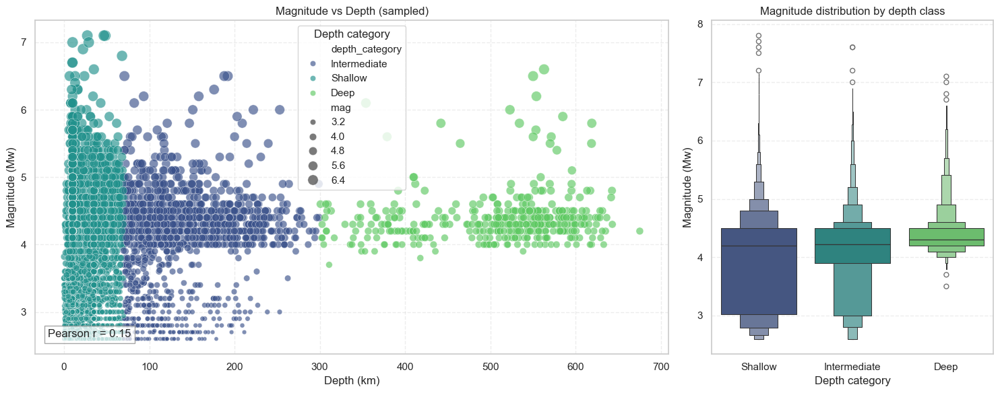

In [27]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

depth_mag_df = featured_eq_df[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 5.2.1.")

sample_limit = 8000
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]
depth_order = depth_order if depth_order else None
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})
sns.scatterplot(
    data=plot_df,
    x="depth",
    y="mag",
    hue="depth_category",
    size="mag",
    sizes=(20, 140),
    palette="viridis",
    alpha=0.65,
    ax=axes[0]
)
axes[0].set_title("Magnitude vs Depth (sampled)")
axes[0].set_xlabel("Depth (km)")
axes[0].set_ylabel("Magnitude (Mw)")
axes[0].grid(True, linestyle="--", alpha=0.35)
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)


legend0 = axes[0].get_legend()
if legend0 is not None:
    legend0.set_title("Depth category")
sns.boxenplot(
    data=depth_mag_df,
    x="depth_category",
    y="mag",
    hue="depth_category",
    order=depth_order,
    palette="viridis",
    dodge=False,
    ax=axes[1]
)
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()
axes[1].set_title("Magnitude distribution by depth class")
axes[1].set_xlabel("Depth category")
axes[1].set_ylabel("Magnitude (Mw)")
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())
    )
)
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})
depth_summary


# depth-magnitude relationship: sampled scatter colored by depth class and sized by magnitude,
# boxen plots per depth category, Pearson correlation, and tabulated counts/medians/strong quake
# rates per depth bin to set up regional and mapping cuts.



**Figure 15. Magnitude vs depth (scatter + depth-class distribution).**


The scatter plot and depth-class distributions show large overlap with non-linear structure, indicating simple linear rules are insufficient.

#### 5.2.3 Global Spatial Distribution (Epicentre Map)

An interactive globe (with static fallback) shows epicentres scaled by magnitude and colored by depth, bridging global patterns and regional summaries.

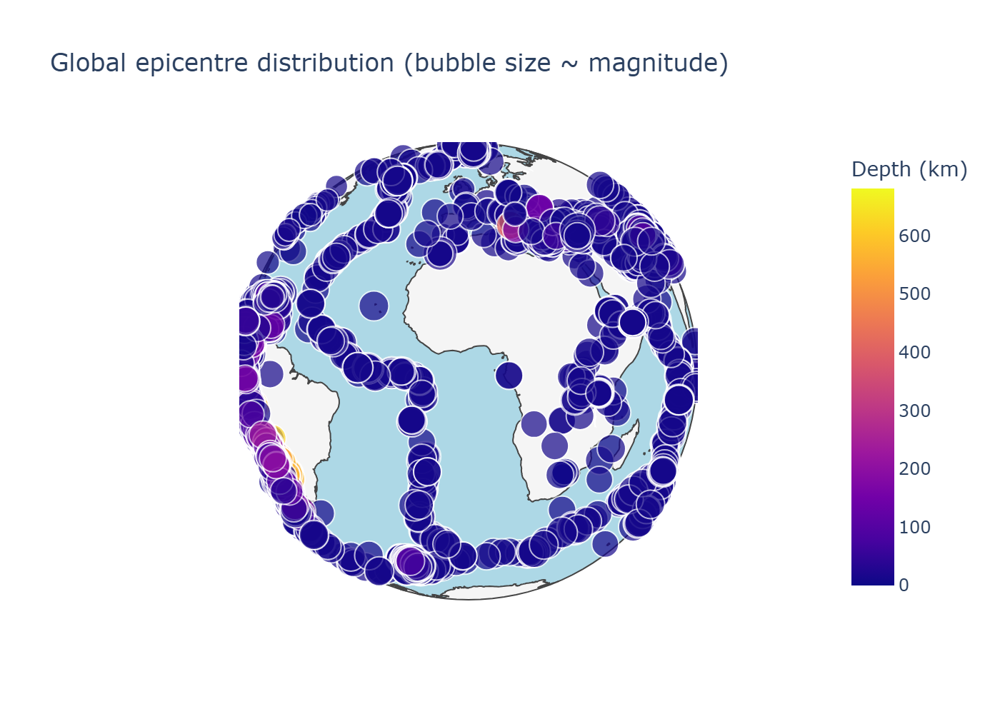

In [28]:
from pandas.api.types import is_datetime64_any_dtype
from IPython.display import HTML, Image, display

px = libs.px
plt = libs.plt
pd = libs.pd
np = libs.np

map_df = featured_eq_df.copy()
if "time" in map_df.columns:
    time_col = map_df["time"]
    if not is_datetime64_any_dtype(time_col):
        time_col = pd.to_datetime(time_col, errors="coerce", utc=True)
    map_df["time_str"] = time_col.dt.strftime("%Y-%m-%d %H:%M:%S")

if "broad_region" in map_df.columns:
    map_df = map_df.copy()
    map_df["broad_region_label"] = map_df["broad_region"].astype(str).str.replace("_", " ")

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "broad_region_label", "depth", "place", "time_str"]
available_cols = [c for c in map_cols if c in map_df.columns]
map_df = map_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 5.2.2.")

map_df["place"] = map_df["place"].fillna("Unknown location")
map_df["mag_size"] = np.clip(map_df["mag"], 3, None)
map_df["is_strong"] = map_df["mag"] >= 6.0
map_df["hover_label"] = (
    map_df["place"]
    + " | Mw " + map_df["mag"].round(1).astype(str)
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"
 )

fig = None
if px is not None:
    import plotly.io as pio
    pio.renderers.default = "notebook_connected"
    labels = {
        "depth": "Depth (km)",
        "mag": "Magnitude (Mw)",
        "mag_category": "Magnitude category",
        "broad_region_label": "Broad region",
        "time_str": "Event time (UTC)",
    }
    fig = px.scatter_geo(
        map_df,
        lat="latitude",
        lon="longitude",
        color="depth",
        size="mag_size",
        size_max=18,
        hover_name="place",
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region_label":True, "time_str":True},
        projection="orthographic",
        template="plotly_white",
        title="Global epicentre distribution (bubble size ~ magnitude)",
        labels=labels,
    )
    fig.update_layout(legend_title_text="Depth (km)")
    fig.update_geos(showocean=True, oceancolor="lightblue", showland=True, landcolor="whitesmoke")
    html = fig.to_html(full_html=False, include_plotlyjs="embed")
    display(HTML(html))
else:
    fig, ax = plt.subplots(figsize=(14, 7))
    scatter = ax.scatter(
        map_df["longitude"],
        map_df["latitude"],
        c=map_df["mag"],
        cmap="plasma",
        s=np.square(map_df["mag_size"]) * 1.5,
        alpha=0.6,
        linewidths=0.15,
        edgecolor="black",
    )
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.grid(True, linestyle="--", alpha=0.3)
    plt.colorbar(scatter, ax=ax, label="Magnitude (Mw)")

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),
        pct_strong=("strong_pct", "mean"),
        median_depth=("depth", "median"),
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_strong"] = region_summary["pct_strong"] * 100
region_summary = region_summary.round({"events": 0, "pct_global": 1, "pct_strong": 1, "median_depth": 0})
region_summary

export_epicentre_outputs = True
if export_epicentre_outputs:
    MAPS_DIR.mkdir(parents=True, exist_ok=True)
    TABLES_DIR.mkdir(parents=True, exist_ok=True)

    region_summary.to_csv(TABLES_DIR / "region_summary_section5_2.csv")
    png_path = MAPS_DIR / "epicentre_map_section5_2.png"
    if px is not None and fig is not None:
        fig.write_html(MAPS_DIR / "epicentre_map_section5_2.html", include_plotlyjs="embed")
        if libs.HAS_KALEIDO:
            try:
                fig.write_image(png_path, scale=2)
            except Exception as exc:
                print(f"Plotly static export skipped: {exc}")
        else:
            print("Plotly static export skipped: kaleido not installed in this environment.")
    elif fig is not None:
        fig.savefig(png_path, dpi=300, bbox_inches="tight")

    if png_path.exists():
        display(Image(filename=str(png_path)))

# Epicentre atlas with exports: global bubble map (Plotly globe if available, static fallback
# otherwise), rich hover labels including time strings to avoid Plotly datetime issues,
# per region summary (counts, share of global events, strong quake rate, median depth), and
# optional HTML/PNG/CSV exports for offline use.

**Figure 16. Plotly epicentre map (interactive) with static fallback.**


An interactive map (with export) bridges global patterns with regional summaries. Broad regions provide useful “big picture” structure but smooth over fault-scale detail.

This section combines the map and regional summary table to compare broad seismicity patterns across regions while acknowledging that binning smooths fault-scale detail.

The summarised outputs are exported (CSV/HTML/PNG) to support transparency and reproducibility.

#### 5.2.4 Regional Seismicity Comparisons

Regional summaries compare counts, strong-event share, and depth mix to reveal heterogeneity masked by global averages.

**Table 7. Regional seismicity comparison summary.**


,events,median_mag,iqr_mag,pct_major,median_depth
broad_region,,,,,
Americas west,8852,3.10,1.30,0.1,21.0
Asia WestPacific,6797,4.40,0.40,0.1,35.0
Americas east Atlantic,4156,4.01,1.19,0.0,28.0
Pacific Oceania,2566,4.40,0.50,0.2,35.0
Europe Africa,2061,4.40,0.50,0.1,10.0
unknown,0,NaN,NaN,NaN,NaN


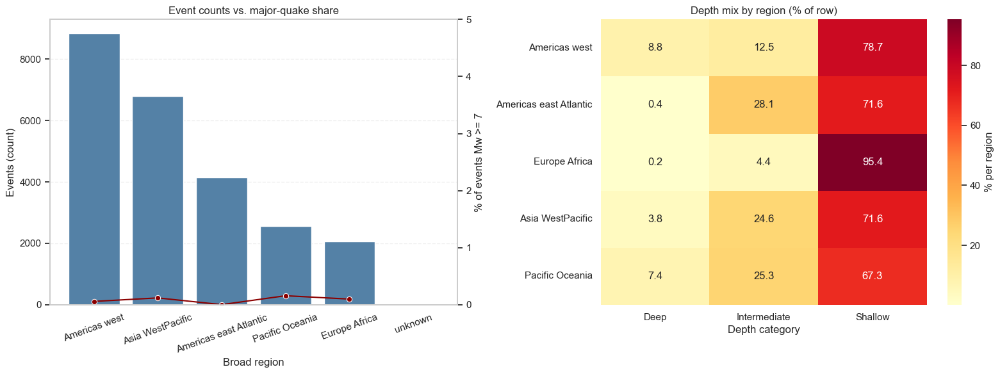

In [29]:

sns = libs.sns
pd = libs.pd
plt = libs.plt

region_cols = ["broad_region", "mag", "depth", "depth_category"]
region_cols = [c for c in region_cols if c in featured_eq_df.columns]
region_df = featured_eq_df[region_cols].dropna(subset=["broad_region", "mag"]).copy()
if region_df.empty:
    raise ValueError("No regional samples available for Section 5.2.3.")

region_df["is_major"] = region_df["mag"] >= 7.0

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),
        pct_major=("is_major", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_major"] = region_summary["pct_major"] * 100
region_plot = region_summary.reset_index()

region_plot["region_label"] = region_plot["broad_region"].astype(str).str.replace("_", " ")

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100

if not depth_mix.empty:
    depth_mix.index = depth_mix.index.to_series().astype(str).str.replace("_", " ")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(data=region_plot, x="region_label", y="events", color="steelblue", ax=axes[0])
axes[0].set_title("Event counts vs. major-quake share")
axes[0].set_xlabel("Broad region")
axes[0].set_ylabel("Events (count)")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)

ax2 = axes[0].twinx()
sns.lineplot(data=region_plot, x="region_label", y="pct_major", marker="o", color="darkred", ax=ax2)
ax2.set_ylabel("% of events Mw >= 7")
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))
ax2.grid(False)

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)
    axes[1].axis("off")
else:
    sns.heatmap(
        depth_mix,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        cbar_kws={"label": "% per region"},
        ax=axes[1]
    )
    axes[1].set_title("Depth mix by region (% of row)")
    axes[1].set_xlabel("Depth category")
    axes[1].set_ylabel("")

plt.tight_layout()

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})
region_summary_display = region_summary.copy()
region_summary_display.index = region_summary_display.index.to_series().astype(str).str.replace("_", " ")
region_summary_display


# Regional severity dashboard: per region event counts, median and IQR magnitude, major-quake
# share, and median depth, combined with a depth-mix heatmap to show clustering and depth
# distribution before quality and modelling sections.



**Figure 17. Regional seismicity comparisons.**


Counts, median magnitudes, and depth mix vary by region. High event counts do not automatically imply high strong-event share, so frequency alone is not a severity indicator.

Region is treated as contextual rather than deterministic and interpreted cautiously due to monitoring bias.

#### 5.2.5 Quality Score & Uncertainty Analysis

The composite quality score aggregates gap, RMS, and uncertainty into a 0-1 index (1 = best) to assess measurement reliability across the catalogue.

(                        events  mean quality  p10 quality  p90 quality  \
 broad_region                                                             
 Europe Africa             2061         0.852        0.805        0.895   
 Asia WestPacific          6797         0.837        0.792        0.880   
 Americas west             8852         0.831        0.760        0.936   
 Americas east Atlantic    4156         0.824        0.748        0.885   
 Pacific Oceania           2566         0.823        0.769        0.873   
 unknown                      0           NaN          NaN          NaN   
 
                         median magError  median depthError  \
 broad_region                                                 
 Europe Africa                     0.110              1.919   
 Asia WestPacific                  0.113              4.751   
 Americas west                     0.115              2.000   
 Americas east Atlantic            0.100              3.742   
 Pacific Oceania    

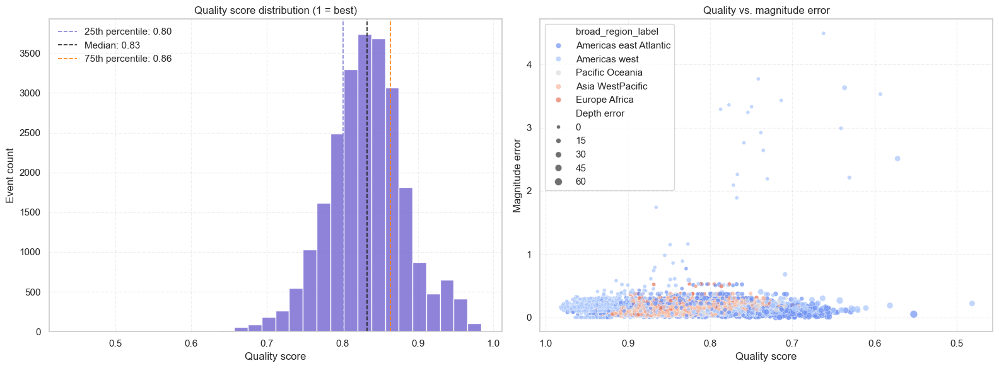

In [30]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]
quality_cols = [c for c in quality_base_cols if c in featured_eq_df.columns]
quality_df = featured_eq_df[quality_cols].dropna(subset=["quality_score"]).copy()
if quality_df.empty:
    raise ValueError("quality_score not available for Section 5.2.4.")

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(
    data=quality_df,
    x="quality_score",
    bins=30,
    color="slateblue",
    edgecolor="white",
    ax=axes[0]
)
axes[0].set_title("Quality score distribution (1 = best)")
axes[0].set_xlabel("Quality score")
axes[0].set_ylabel("Event count")
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")
axes[0].legend(loc="best", frameon=False)
axes[0].grid(True, linestyle="--", alpha=0.3)

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]
scatter_df = quality_df[scatter_cols].dropna()
scatter_df = scatter_df.copy()
if "broad_region" in scatter_df.columns:
    scatter_df["broad_region_label"] = scatter_df["broad_region"].astype(str).str.replace("_", " ")
if "depthError" in scatter_df.columns:
    scatter_df["Depth error"] = scatter_df["depthError"]
axes[1].set_title("Quality vs. magnitude error")
axes[1].set_xlabel("Quality score")
axes[1].set_ylabel("Magnitude error")
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)
    axes[1].grid(False)
else:
    hue_col = "broad_region_label" if "broad_region_label" in scatter_df.columns else None
    size_col = "Depth error" if "Depth error" in scatter_df.columns else None
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )
    axes[1].grid(True, linestyle="--", alpha=0.3)
    axes[1].invert_xaxis()
    axes[1].legend(loc="best")

plt.tight_layout()

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())
region_quality = region_quality.sort_values("mean_quality", ascending=False)
region_quality = region_quality.round(3)

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]


region_quality_display = region_quality.copy()
region_quality_display.index = region_quality_display.index.str.replace("_", " ")
region_quality_display.columns = [c.replace("_", " ") for c in region_quality_display.columns]

low_quality_display = low_quality_events.copy()
low_quality_display.columns = [c.replace("_", " ") for c in low_quality_display.columns]
low_quality_display = low_quality_display.rename_axis(None)

region_quality_display, low_quality_display


# Quality analysis: distribution of `quality_score` with quantile markers, scatter of quality
# versus magnitude error (colored by region, sized by depth error), regional aggregates, and a
# small set of lowest-quality events to close Section 5 with a reliability check.



**Figure 18. Quality score and uncertainty diagnostics.**


A composite quality score summarises uncertainty fields to support interpretation of reliability and potential bias. This is treated as a diagnostic lens rather than a causal driver.

---

## 6. Strong Quake Classification

The modelling task is framed as **supervised classification**: predict whether an event is strong (Mw ≥ 6.0). This is not forecasting future earthquakes; it tests whether engineered, non-leaking predictors provide measurable separation at the time of recording.

Because strong events are extremely rare (~0.6%), evaluation focuses on **precision-recall behaviour** and average precision rather than accuracy.


### 6.1 Data split, pipeline, and models

A hold-out split is used to build and compare baseline models:
- Logistic Regression (interpretable linear baseline)
- Random Forest (non-linear baseline)
- XGBoost (gradient boosting baseline)

A strict feature policy is applied to reduce leakage: predictors that directly encode magnitude or the target definition are excluded from training.

In [31]:

# Initialise evaluation artifacts for linting; populated in Section 6.1 hold-out cell. Creates placeholder variables for results of ML evalaution
y_prob_best = None
y_test = None
thresholds_info = None
reliability_curve = None
from typing import TYPE_CHECKING

if TYPE_CHECKING:
    numeric_features = []
    categorical_features = []
    best_model_grid = {"model": "log_reg_elastic", "params": {"C": 1.0, "l1_ratio": 0.5}}
    model_best = None
    best_threshold = 0.5
    X_test = None
    X_train = None
    y_train = None
    feature_cols = []



Threshold tuning is a policy choice: higher recall captures more strong events but increases false alarms, while stricter thresholds improve precision at the cost of missed events. Results are reported as global baselines rather than operational warnings.


In [32]:
import importlib

def ensure_section9_deps(verbose=True, install_missing=False):
    """Ensure the modelling section dependencies (matplotlib and scikit-learn) are available."""
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")

    if not missing:
        if verbose:
            print("Modelling dependencies ready:", libs.availability())
        return True

    if verbose:
        print("Missing modelling dependencies:", ", ".join(missing))
        print("Install these locally to run Section 6 modelling cells (auto-install disabled).")
    return False

if not globals().get("_SECTION9_READY", False):
    _SECTION9_READY = ensure_section9_deps(verbose=True)


# Modelling preparation: verify matplotlib and scikit-learn availability (and prompt manual
# installation when missing) so the Section 6 classification runs without dependency failures.

Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [33]:
!pip install xgboost

   ---------------------------------------- 0.0/72.0 MB ? eta -:--:--
    --------------------------------------- 1.0/72.0 MB 9.6 MB/s eta 0:00:08
   - -------------------------------------- 3.1/72.0 MB 9.5 MB/s eta 0:00:08
   -- ------------------------------------- 5.0/72.0 MB 9.6 MB/s eta 0:00:07
   --- ------------------------------------ 5.8/72.0 MB 9.3 MB/s eta 0:00:08
   --- ------------------------------------ 5.8/72.0 MB 9.3 MB/s eta 0:00:08
   --- ------------------------------------ 6.0/72.0 MB 5.4 MB/s eta 0:00:13
   ---- ----------------------------------- 7.9/72.0 MB 5.8 MB/s eta 0:00:12
   ----- ---------------------------------- 9.7/72.0 MB 6.3 MB/s eta 0:00:10
   ------ --------------------------------- 11.8/72.0 MB 6.7 MB/s eta 0:00:09
   ------- -------------------------------- 13.9/72.0 MB 7.1 MB/s eta 0:00:09
   -------- ------------------------------- 16.0/72.0 MB 7.5 MB/s eta 0:00:08
   ---------- ----------------------------- 18.4/72.0 MB 7.7 MB/s eta 0:00:07
  

In [34]:
import numpy as np
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate, ParameterGrid

The modelling pipeline trains each baseline model and predicts the probability that an event is strong (Mw ≥ 6.0).

To avoid target leakage, magnitude-derived and target-defining fields are excluded from the predictor set; models use non-leaking metadata and diagnostic features available at the time of recording.

In [35]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.model_selection import train_test_split, cross_validate, ParameterGrid
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

# --- STEP 1: FORCE CLEAN THE DATA  ---
print("1. Cleaning data...")

leakage_cols = [
    'mag', 'magType', 'magError', 'magNst', 'energy_log10_J', 'is_strong_quake',
    'mag_category', 'mag_category_code', 'nst', 'gap', 'dmin', 'rms', 
    'gap_norm', 'magError_norm', 'dmin_norm', 'rms_norm', 'depthError', 
    'depthError_norm', 'horizontalError', 'magSource', 'locationSource',                      
    'time', 'time_str', 'date', 'sig', 'alert', 'tsunami', 'status', 
    'type', 'quality_score', 'net', 'id', 'updated', 'place'
]



# Only drop what actually exists in the dataframe
cols_to_drop = [c for c in featured_eq_df.columns if c in leakage_cols]
print(f"   Dropping columns: {cols_to_drop}")

# Define X and y
X = featured_eq_df.drop(columns=cols_to_drop)
y = featured_eq_df['is_strong_quake']

# Re-split
X_search, X_test, y_search, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
print(f"   New feature count: {X_search.shape[1]}")

#preprocessor
def build_preprocess():
    return ColumnTransformer(
        transformers=[
            ('num', Pipeline([('imputer', SimpleImputer(strategy='median')), ('scaler', StandardScaler())]), make_column_selector(dtype_include=['number'])),
            ('cat', Pipeline([('imputer', SimpleImputer(strategy='constant', fill_value='missing')), ('onehot', OneHotEncoder(handle_unknown='ignore'))]), make_column_selector(dtype_include=['object', 'category', 'bool']))
        ], verbose_feature_names_out=False
    )

# model configuration
print("2. Configuring models...")
# Calculate ratio for XGBoost
ratio = float(np.sum(y_search == 0)) / np.sum(y_search == 1)

models_config = [
    {
        "name": "log_reg_elastic",
        "estimator": LogisticRegression(
            penalty='elasticnet', solver='saga', class_weight='balanced', 
            max_iter=5000, random_state=42
        ),
        "param_grid": [
            {"clf__C": [0.1], "clf__l1_ratio": [0.5]},
            {"clf__C": [1.0], "clf__l1_ratio": [0.5]},
            {"clf__C": [10.0], "clf__l1_ratio": [0.5]}
        ]
    },
    {
        "name": "random_forest",
        "estimator": RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
        "param_grid": [
            {"clf__n_estimators": [100], "clf__max_depth": [10]},
            {"clf__n_estimators": [200], "clf__max_depth": [20]},
            {"clf__n_estimators": [300], "clf__max_depth": [None]}
        ]
    },
    {
        "name": "xgboost",
        "estimator": xgb.XGBClassifier(
            eval_metric='logloss', scale_pos_weight=ratio, use_label_encoder=False, 
            random_state=42, n_jobs=-1
        ),
        "param_grid": [
            {"clf__n_estimators": [100], "clf__learning_rate": [0.1], "clf__max_depth": [3]},
            {"clf__n_estimators": [200], "clf__learning_rate": [0.05], "clf__max_depth": [6]},
            {"clf__n_estimators": [300], "clf__learning_rate": [0.01], "clf__max_depth": [6]}
        ]
    }
]

# train
print("3. Training models...")
results = []
for config in models_config:
    print(f"   Running {config['name']}...")
    for params in ParameterGrid(config['param_grid']):
        pipeline = Pipeline([('preprocess', build_preprocess()), ('clf', config['estimator'])])
        pipeline.set_params(**params)
        
        cv_results = cross_validate(pipeline, X_search, y_search, cv=3, scoring='average_precision', n_jobs=-1)
        
        results.append({
            "model": config['name'], 
            "params": {k.replace("clf__", ""): v for k, v in params.items()}, 
            "ap_mean": cv_results['test_score'].mean()
        })

# results
results_sorted = sorted(results, key=lambda x: x['ap_mean'], reverse=True)
print("\n--- FINAL RESULTS ---")
for i, res in enumerate(results_sorted):
    print(f"{i+1}. {res['model']} | AP: {res['ap_mean']:.4f}")

best_result = results_sorted[0]
best_model_grid = {"model": best_result['model'], "params": best_result['params']}
print(f"\nWINNER: {best_model_grid['model']}")

1. Cleaning data...
   Dropping columns: ['time', 'mag', 'magType', 'nst', 'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource', 'time_str', 'mag_category', 'is_strong_quake', 'energy_log10_J', 'gap_norm', 'rms_norm', 'depthError_norm', 'magError_norm', 'quality_score', 'mag_category_code']
   New feature count: 31
2. Configuring models...
3. Training models...
   Running log_reg_elastic...
   Running random_forest...
   Running xgboost...

--- FINAL RESULTS ---
1. xgboost | AP: 0.0354
2. log_reg_elastic | AP: 0.0304
3. random_forest | AP: 0.0304
4. random_forest | AP: 0.0291
5. xgboost | AP: 0.0272
6. random_forest | AP: 0.0231
7. xgboost | AP: 0.0227
8. log_reg_elastic | AP: 0.0183
9. log_reg_elastic | AP: 0.0170

WINNER: xgboost


Across the tested baselines, XGBoost performs best, but precision remains low due to the rarity of strong events and overlap between classes. Results are presented as a baseline and interpreted cautiously rather than as forecasting.


Leakage control and robustness checks

Leakage verification audits the feature set to reduce target leakage. Because strong earthquakes are rare, metrics are statistically unstable; bootstrap confidence intervals and a time-ordered split are used as additional reliability checks.


Training verification model...

--- TOP PREDICTIVE FEATURES ---
                        Feature    Weight
61           has_magError_False -2.832016
62            has_magError_True  2.698283
56   broad_region_Americas_west -2.168777
1                     longitude -1.993289
16            broad_region_code  1.732764
2                         depth  1.507380
0                      latitude -1.466933
49  depth_category_Intermediate  1.321209
12         horizontalError_norm -1.305777
58   broad_region_Europe_Africa  1.286868


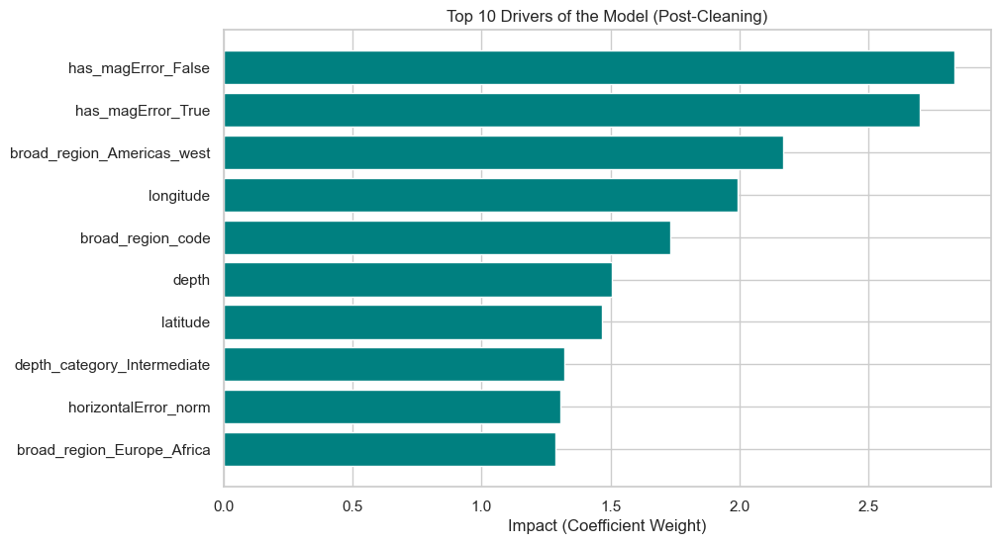

In [36]:
# LEAKAGE VERIFICATION & PHYSICS CHECK
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline

# Build a simple pipeline for verification
# Logistic Regression because it's transparent (we can read the weights)
debug_pipeline = Pipeline([
    ('preprocess', build_preprocess()),
    ('clf', LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, class_weight='balanced', max_iter=5000, random_state=42))
])

#Fit on the CLEAN data
print("Training verification model...")
debug_pipeline.fit(X_search, y_search)

#Get Feature Names & Weights
feature_names = debug_pipeline.named_steps['preprocess'].get_feature_names_out()
coeffs = debug_pipeline.named_steps['clf'].coef_[0]

#Show Top Features
importance = pd.DataFrame({
    'Feature': feature_names,
    'Weight': coeffs,
    'Abs_Weight': abs(coeffs)
})

# Sort by impact
top_features = importance.sort_values(by='Abs_Weight', ascending=False).head(10)

print("\n--- TOP PREDICTIVE FEATURES ---")
print(top_features[['Feature', 'Weight']])

# 5. Plot for visual confirmation
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Abs_Weight'], color='teal') # Changed color to teal for "Good"
plt.gca().invert_yaxis()
plt.title("Top 10 Drivers of the Model (Post-Cleaning)")
plt.xlabel("Impact (Coefficient Weight)")
plt.show()

**6.1.1: leakage verification status**

Leakage checks highlight metadata fields that are tightly linked to the target definition; these are used to refine the list of excluded predictors.






**6.1.2: Model training and metric summary**

Because strong earthquakes are rare, evaluation focuses on precision-recall behaviour and average precision rather than accuracy.

Confusion matrices and ROC curves provide complementary views of error behaviour under a chosen threshold, and bootstrap confidence intervals are reported because the number of positives in the test set is small.


✅ Retraining xgboost on full search data...

--- Final Test Set Evaluation ---
              precision    recall  f1-score   support

       False       1.00      0.84      0.91      4858
        True       0.02      0.62      0.04        29

    accuracy                           0.84      4887
   macro avg       0.51      0.73      0.48      4887
weighted avg       0.99      0.84      0.91      4887



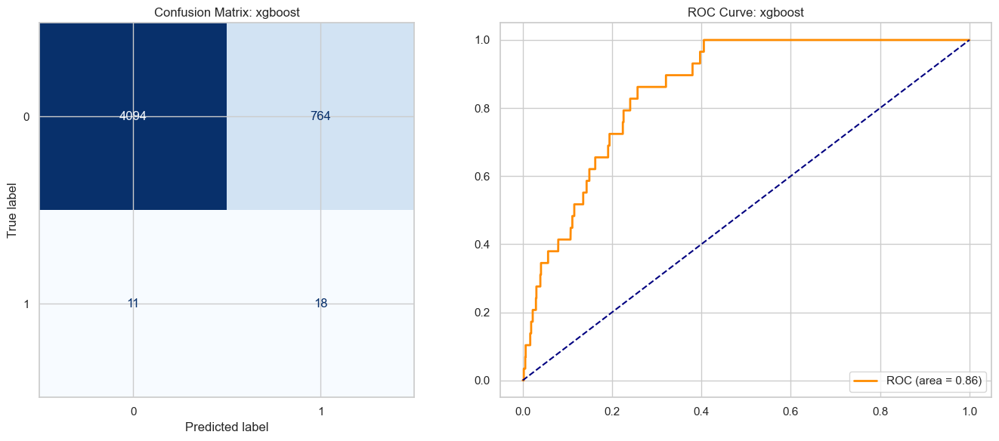

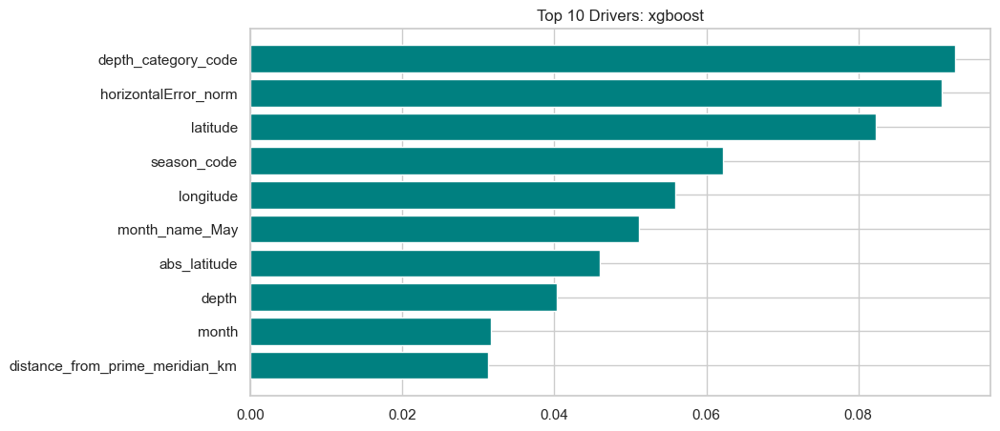

In [37]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.pipeline import Pipeline

# 1. Setup the winner
best_name = best_model_grid['model']
best_params = best_model_grid['params']
best_config = next(item for item in models_config if item["name"] == best_name)
base_estimator = best_config["estimator"]

# 2. Build Pipeline and Apply Hyperparameters
final_pipeline = Pipeline([
    ('preprocess', build_preprocess()),
    ('clf', base_estimator)
])
final_params_formatted = {f"clf__{k}": v for k, v in best_params.items()}
final_pipeline.set_params(**final_params_formatted)

# 3. Retrain on Full Search Data
print(f"✅ Retraining {best_name} on full search data...")
final_pipeline.fit(X_search, y_search)

# 4. PRESERVED FROM BLOCK 1: Safe Feature Handling
X_test_safe = X_test.copy()
required_cols = ['magSource', 'locationSource', 'horizontalError', 'depthError_norm', 'depthError']
for col in required_cols:
    if col not in X_test_safe.columns:
        X_test_safe[col] = 0 if 'Error' in col else 'unknown'

# 5. Predict and Evaluate
y_pred = final_pipeline.predict(X_test_safe)
y_scores = final_pipeline.predict_proba(X_test_safe)[:, 1] if hasattr(final_pipeline, "predict_proba") else final_pipeline.decision_function(X_test_safe)

print("\n--- Final Test Set Evaluation ---")
print(classification_report(y_test, y_pred))

# 6. Visualizations (Confusion Matrix, ROC, and Feature Importance)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
cm = confusion_matrix(y_test, y_pred)
ConfusionMatrixDisplay(confusion_matrix=cm).plot(ax=ax1, cmap='Blues', colorbar=False)
ax1.set_title(f"Confusion Matrix: {best_name}")

fpr, tpr, _ = roc_curve(y_test, y_scores)
ax2.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC (area = {auc(fpr, tpr):.2f})')
ax2.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax2.set_title(f'ROC Curve: {best_name}')
ax2.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Extract and Plot Feature Importance
try:
    if hasattr(final_pipeline.named_steps['clf'], 'feature_importances_'):
        importances = final_pipeline.named_steps['clf'].feature_importances_
        feature_names = final_pipeline.named_steps['preprocess'].get_feature_names_out()
        feat_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
        top_features = feat_df.sort_values(by='Importance', ascending=False).head(10)
        
        plt.figure(figsize=(10, 5))
        plt.barh(top_features['Feature'], top_features['Importance'], color='teal')
        plt.gca().invert_yaxis()
        plt.title(f"Top 10 Drivers: {best_name}")
        plt.show()
except Exception as e:
    print(f"Feature importance unavailable: {e}")

**Figure 19. Model evaluation (confusion matrix + ROC + PR).**


Model evaluation highlights a typical rare-event trade-off: recall can be improved, but precision may remain low due to overlap and the base-rate problem.

Metrics and plots (confusion, ROC, PR) are interpreted cautiously and presented as a baseline rather than as an operational warning system.


### 6.2 Evaluation comparative visuals (confusion, ROC, PR)



Retraining the best version of each model for scientific comparison...


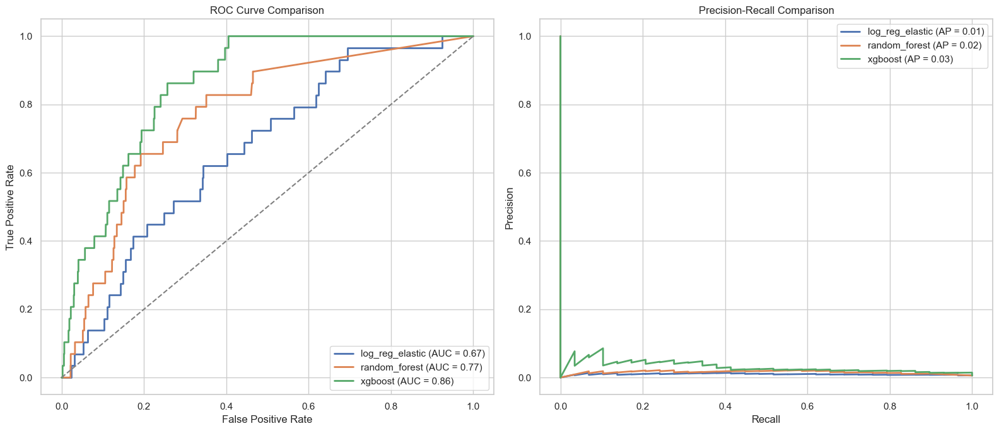

In [38]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.pipeline import Pipeline

# 1. Setup the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
print("Retraining the best version of each model for scientific comparison...")

# 2. Extract the best performing parameters for each of the 3 model types
model_names = ["log_reg_elastic", "random_forest", "xgboost"]
best_configs = []

for name in model_names:
    # Filter 'results' for this specific model type
    model_entries = [r for r in results if r['model'] == name]
    if model_entries:
        # Select the entry with the highest Average Precision (AP)
        best_entry = max(model_entries, key=lambda x: x['ap_mean'])
        best_configs.append(best_entry)

# 3. Retrain and plot each "best" model
for res in best_configs:
    name = res['model']
    best_params = res['params']
    
    # Locate the original estimator settings from models_config
    base_config = next(c for c in models_config if c['name'] == name)
    estimator = base_config['estimator']
    
    # Re-build the clean pipeline
    temp_pipeline = Pipeline([
        ('preprocess', build_preprocess()),
        ('clf', estimator)
    ])
    
    # Apply the winning parameters (adding back the 'clf__' prefix)
    temp_pipeline.set_params(**{f"clf__{k}": v for k, v in best_params.items()})
    
    # Train on the clean training data
    temp_pipeline.fit(X_search, y_search)
    
    # Generate probabilities for the test set
    y_probs = temp_pipeline.predict_proba(X_test)[:, 1]
    
    # --- Plot ROC Curve ---
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    ax1.plot(fpr, tpr, lw=2, label=f'{name} (AUC = {auc(fpr, tpr):.2f})')
    
    # --- Plot Precision-Recall Curve ---
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    ap_score = average_precision_score(y_test, y_probs)
    ax2.plot(recall, precision, lw=2, label=f'{name} (AP = {ap_score:.2f})')

# 4. Finalize the Visuals
ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
ax1.set_xlabel('False Positive Rate')
ax1.set_ylabel('True Positive Rate')
ax1.set_title('ROC Curve Comparison')
ax1.legend(loc="lower right")

ax2.set_xlabel('Recall')
ax2.set_ylabel('Precision')
ax2.set_title('Precision-Recall Comparison')
ax2.legend(loc="upper right")

plt.tight_layout()
plt.show()

ROC curves summarise ranking ability, while precision-recall curves better reflect performance under extreme class imbalance. Average precision remains limited by rarity and overlap, so results are interpreted as baselines.


### 6.3 Drivers of strong quake predictions

Feature importance / driver analysis is used to interpret model behaviour. Importances are treated as indicators of association (not causality) and cross-checked against EDA. Bootstrapped confidence intervals are reported because the number of strong events in the test set is small.

In [39]:
import numpy as np

# 1. Variable Alignment: Match the 'Nuclear' evaluation results
# We use 'y_probs' from the previous retraining cell
if 'y_probs' in globals():
    y_prob_best = y_probs
else:
    # If y_probs is missing, we re-generate it from the final_pipeline
    y_prob_best = final_pipeline.predict_proba(X_test_safe)[:, 1]

# 2. Threshold alignment
# If you haven't run a threshold optimization cell, default to 0.5
if 'best_threshold' not in globals():
    best_threshold = 0.5

# 3. Standard checks
if 'y_test' not in globals():
    raise NameError('y_test missing; run the hold-out evaluation cell first.')

# 4. Bootstrap confidence intervals
n_boot = 200
rng = np.random.default_rng(42)
ap_samples = []
recall_samples = []

y_prob_arr = np.array(y_prob_best)
y_true_arr = np.array(y_test)

print(f"Bootstrapping 95% CI for AP and Recall (Threshold: {best_threshold})...")

for _ in range(n_boot):
    # Resample with replacement
    idx = rng.integers(0, len(y_true_arr), len(y_true_arr))
    y_true_b = y_true_arr[idx]
    y_prob_b = y_prob_arr[idx]
    
    # Calculate binary predictions for this bootstrap sample
    y_pred_b = (y_prob_b >= best_threshold).astype(int)
    
    # Using your existing libs dependency
    ap_samples.append(libs.average_precision_score(y_true_b, y_prob_b))
    recall_samples.append(libs.recall_score(y_true_b, y_pred_b, zero_division=0))

# 5. Calculate Percentiles
ap_ci = np.percentile(ap_samples, [2.5, 97.5])
recall_ci = np.percentile(recall_samples, [2.5, 97.5])

print(f"\n--- Final Statistical Reliability ---")
print(f"AP bootstrap 95% CI: {ap_ci[0]:.3f} to {ap_ci[1]:.3f}")
print(f"Recall bootstrap 95% CI: {recall_ci[0]:.3f} to {recall_ci[1]:.3f}")

Bootstrapping 95% CI for AP and Recall (Threshold: 0.5)...

--- Final Statistical Reliability ---
AP bootstrap 95% CI: 0.020 to 0.069
Recall bootstrap 95% CI: 0.454 to 0.815


In [40]:
import pandas as pd
from sklearn.metrics import precision_score, recall_score, f1_score

# 1. Variable Alignment: Use 'y_probs' and 'y_test' from your final evaluation
if 'y_probs' not in globals() or 'y_test' not in globals():
    print("Error: Required artifacts missing. Please run the final evaluation cell first.")
else:
    # Use the threshold from your best model or default to 0.5
    current_threshold = globals().get('best_threshold', 0.5)
    
    # 2. Re-map local variables for the diagnostic
    y_prob_local = y_probs
    y_test_local = y_test
    y_pred_local = (y_prob_local >= current_threshold).astype(int)

    def group_report(col):
        # Access the original dataframe to get the groups (regions/depth)
        # Assuming featured_eq_df or df_model is the source
        source_df = globals().get('featured_eq_df')
        target_col = 'is_strong_quake'

        if source_df is None or col not in source_df.columns:
            print(f"Column {col} missing in source data; skipping.")
            return

        # 3. Create a results dataframe aligned with the test set index
        # This ensures we are only looking at the hold-out test results
        results_df = pd.DataFrame({
            'y_true': y_test_local,
            'y_pred': y_pred_local,
            'y_prob': y_prob_local
        }, index=y_test_local.index)

        # Join with the group labels (e.g., broad_region) from the original data
        merged = results_df.join(source_df[[col]])
        
        label = col.replace("_", " ")
        print(f"\n--- Diagnostic Report: {label} ---")
        print(f"Using classification threshold: {current_threshold}")

        for grp, part in merged.groupby(col, observed=True):
            y_true_g = part['y_true'].astype(int)
            y_pred_g = part['y_pred'].astype(int)
            
            # Only report if there are actually quakes in this category
            if len(y_true_g) > 0:
                p = precision_score(y_true_g, y_pred_g, zero_division=0)
                r = recall_score(y_true_g, y_pred_g, zero_division=0)
                f1 = f1_score(y_true_g, y_pred_g, zero_division=0)
                
                grp_label = str(grp).replace("_", " ")
                print(f" * {grp_label:15} | n={len(part):<5} | pos={int(y_true_g.sum()):<3} | P={p:.2f} | R={r:.2f} | F1={f1:.2f}")

    # 4. Run the diagnostics
    for c in ("broad_region", "depth_category"):
        group_report(c)


--- Diagnostic Report: broad region ---
Using classification threshold: 0.5
 * Americas west   | n=1794  | pos=6   | P=0.04 | R=0.50 | F1=0.07
 * Americas east Atlantic | n=854   | pos=3   | P=0.02 | R=0.67 | F1=0.03
 * Europe Africa   | n=383   | pos=4   | P=0.00 | R=0.00 | F1=0.00
 * Asia WestPacific | n=1363  | pos=12  | P=0.02 | R=0.75 | F1=0.04
 * Pacific Oceania | n=493   | pos=4   | P=0.04 | R=1.00 | F1=0.07

--- Diagnostic Report: depth category ---
Using classification threshold: 0.5
 * Deep            | n=246   | pos=2   | P=0.07 | R=1.00 | F1=0.14
 * Intermediate    | n=968   | pos=6   | P=0.01 | R=0.50 | F1=0.02
 * Shallow         | n=3673  | pos=21  | P=0.03 | R=0.62 | F1=0.05


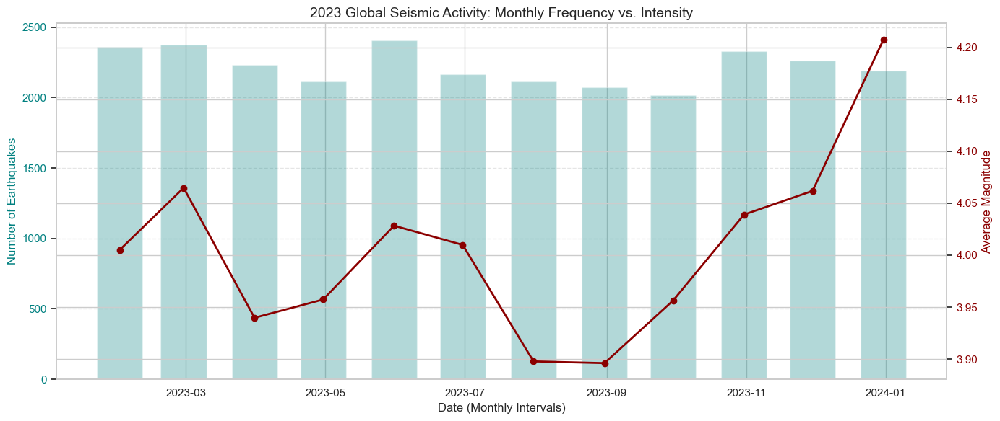

In [45]:
import matplotlib.pyplot as plt

# 1. Ensure time is the index and resample by Month ('ME')
# The researchers use eq_df as the source variable here
temporal_df = eq_df.set_index('time').resample('ME').agg({
    'id': 'count',
    'mag': 'mean'
}).rename(columns={'id': 'Event Count', 'mag': 'Average Magnitude'})

# 2. Create the dual-axis visualization
fig, ax1 = plt.subplots(figsize=(14, 6))

# Plot Event Frequency (Bar Chart)
ax1.bar(temporal_df.index, temporal_df['Event Count'], color='teal', alpha=0.3, width=20, label='Number of Events')
ax1.set_ylabel('Number of Earthquakes', color='teal', fontsize=12)
ax1.tick_params(axis='y', labelcolor='teal')

# Create a second axis for Magnitude (Line Chart)
ax2 = ax1.twinx()
ax2.plot(temporal_df.index, temporal_df['Average Magnitude'], color='darkred', marker='o', linewidth=2, label='Avg Magnitude')
ax2.set_ylabel('Average Magnitude', color='darkred', fontsize=12)
ax2.tick_params(axis='y', labelcolor='darkred')

# Formatting for clarity
plt.title('2023 Global Seismic Activity: Monthly Frequency vs. Intensity', fontsize=14)
ax1.set_xlabel('Date (Monthly Intervals)', fontsize=12)
ax1.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

**Figure 20. Temporal robustness test (time-ordered split).**



A time-ordered split trains on early-year events and tests on later-year events to probe robustness under a more realistic temporal setting. Metrics are noisier because the number of strong events in the future slice is small.


### 6.4 Interpretation

Results show a consistent rare-event pattern: increasing recall tends to increase false alarms, so thresholds represent a policy choice. Baseline models demonstrate that some signal exists, but classification remains difficult because strong events are rare and not separable by any single variable.

### 6.5 Result Integration and Interpretation

The classification results are integrated with EDA: depth structure, regional context, and quality diagnostics help explain where the model struggles and why false positives are expected in a globally pooled, imbalanced catalogue.

---

## 7. Discussion and Interpretation

This analysis confirms global clustering around plate boundaries and demonstrates how measurement uncertainty and monitoring coverage shape recorded patterns.

**7. Visual synthesis for decision-making**

The modelling baseline shows that strong-event detection is possible to a limited extent using non-leaking metadata, but precision remains low due to rarity and class overlap. The results are interpreted as a baseline rather than an operational warning system.

A clear improvement pathway is to add physically meaningful geospatial features such as **distance to plate boundaries** and extend the time window beyond a single year to stabilise rare-event learning.

### 7.1 Discussion of Empirical Patterns

EDA confirms tectonic clustering and shallow dominance, but regional counts are influenced by uneven monitoring and detection thresholds; results are interpreted cautiously.

### 7.2 Interpretation of model behaviour

Baseline models show the expected rare-event trade-off: improving recall increases false alarms, so precision remains low. These outputs are treated as descriptive baselines rather than forecasts.

### 7.3 Synthesis: What the Analysis Tells Us

Future work should extend to multiple years and add physically grounded spatial features (e.g., plate-boundary distance) to improve generalisation and calibration.

---

## 8. Conclusion

### 8.1 Key findings and outcomes

- A reproducible pipeline cleaned the 2023 USGS catalogue from 26,642 to 24,432 earthquake events.
- Strong earthquakes (Mw ≥ 6.0) are extremely rare (~0.6%), driving class imbalance challenges.
- EDA confirms shallow dominance, tectonic clustering, and strong influence of uneven monitoring.
- Baseline models show some detectable signal, but precision remains low at useful recall levels.

### 8.2 Strengths and limitations of the work

**Strengths:** transparent audit logging, interpretable EDA, reproducible outputs, and explicit leakage control in modelling.  
**Limitations:** single-year scope, extreme class imbalance, and reliance on catalogue-derived proxies rather than richer geological context.  
**Future work:** extend to multiple years and add physically grounded spatial features (e.g., plate-boundary distance) to improve generalisation and calibration.

---

## 9. References

- United States Geological Survey (USGS) (2023) 'ANSS Comprehensive Earthquake Catalog (ComCat)'. Available at: https://earthquake.usgs.gov/earthquakes/search/ (Accessed 13 January 2026).

- Harris, C.R., Millman, K.J., van der Walt, S.J., et al. (2020) 'Array programming with NumPy'. Nature, 585(7825), pp.357-362. doi:10.1038/s41586-020-2649-2.

- Reback, J., McKinney, W., Van den Bossche, J., et al. (2023) 'pandas: powerful Python data analysis toolkit'. Available at: https://pandas.pydata.org/docs/ (Accessed 13 January 2026).

- Hunter, J.D. (2007) 'Matplotlib: A 2D graphics environment'. Computing in Science & Engineering, 9(3), pp.90-95. doi:10.1109/MCSE.2007.55.

- Waskom, M.L. (2021) 'seaborn: statistical data visualization'. Journal of Open Source Software, 6(60), p.3021. doi:10.21105/joss.03021.

- Pedregosa, F., Varoquaux, G., Gramfort, A., et al. (2011) 'Scikit-learn: Machine Learning in Python'. Journal of Machine Learning Research, 12, pp.2825-2830.

- Plotly Technologies Inc. (2015) 'Plotly: collaborative data science'. Montreal, QC: Plotly Technologies Inc. Available at: https://plotly.com/ (Accessed 13 January 2026).

- Kluyver, T., Ragan-Kelley, B., Perez, F., et al. (2016) 'Jupyter Notebooks - a publishing format for reproducible computational workflows'. In: Loizides, F. and Schmidt, B. (eds.) Positioning and Power in Academic Publishing: Players, Agents and Agendas. IOS Press, pp.87-90.

- Perez, F. and Granger, B.E. (2007) 'IPython: a system for interactive scientific computing'. Computing in Science & Engineering, 9(3), pp.21-29. doi:10.1109/MCSE.2007.53.

- Van Rossum, G. and Drake, F.L. (2009) Python 3 Reference Manual. Scotts Valley, CA: CreateSpace.


In [43]:

import platform
print("Python version:", platform.python_version())


Python version: 3.14.0
